### Data separation, library import and important functions

In [1]:
### --- importing dependences ---- ###
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import learning_curve
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold, cross_val_score
import xgboost as xgb

import matplotlib.pyplot as plt
import csv
import time
import os
import joblib
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem.Descriptors import *
from rdkit.Chem.rdMolDescriptors import *
from rdkit.Chem.Lipinski import *
from rdkit.Chem.EState import *
from rdkit.Chem.GraphDescriptors import *
from rdkit.Chem.Graphs import *
from math import sqrt, ceil

In [16]:
### important functions
def grafic(y_test, y_pred, color):
    plt.plot(y_test, y_test, linestyle='--', color='black', label='y = x')

    # Plotar os pontos de teste e as previsões
    plt.scatter(y_test, y_pred, alpha=0.5, color=color, label='Pontos de Teste vs. Previsões')

    # Configurar o gráfico
    plt.title('')
    plt.xlabel('Valores reais')
    plt.ylabel('Valores preditos pelo modelo')
    plt.legend('')
    plt.grid(True)

    # Exibir o gráfico

    plt.show()
    
def flatten_list(lst):
    flat_list = []
    for item in lst:
        if isinstance(item, list):
            flat_list.extend(flatten_list(item))
        else:
            flat_list.append(item)
    return flat_list


from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

def calcular_rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def calcular_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def avaliar_modelo(y_true, y_pred):
    resultados = {}

    resultados['MAE'] = mean_absolute_error(y_true, y_pred)
    resultados['MSE'] = mean_squared_error(y_true, y_pred)
    resultados['RMSE'] = calcular_rmse(y_true, y_pred)
    resultados['R2'] = r2_score(y_true, y_pred)
    #resultados['MAPE'] = calcular_mape(y_true, y_pred)

    return resultados

def properties_array(sSmiles):
    try:
        m = Chem.MolFromSmiles(sSmiles)
        p1 = AllChem.GetMorganFingerprintAsBitVect(m, 2, 512)
        p2 = Chem.rdMolDescriptors.GetMACCSKeysFingerprint(m)

        p3 = [1000*FpDensityMorgan1(m), 1000*FpDensityMorgan2(m), 1000*FpDensityMorgan3(m), ExactMolWt(m), HeavyAtomMolWt(m), 1000*MaxAbsPartialCharge(m), 1000*MaxPartialCharge(m), 1000*MinAbsPartialCharge(m), 1000*MinPartialCharge(m), NumRadicalElectrons(m), NumValenceElectrons(m),1000*CalcFractionCSP3(m),10*CalcKappa1(m),10*CalcKappa2(m),10*CalcKappa3(m),CalcLabuteASA(m),CalcNumAliphaticCarbocycles(m),CalcNumAliphaticHeterocycles(m),CalcNumAliphaticRings(m),CalcNumAmideBonds(m),CalcNumAromaticCarbocycles(m),CalcNumAromaticHeterocycles(m),CalcNumAromaticRings(m),CalcNumAtomStereoCenters(m),CalcNumBridgeheadAtoms(m),CalcNumHBA(m),CalcNumHBD(m),CalcNumHeteroatoms(m),CalcNumHeterocycles(m),CalcNumLipinskiHBA(m),CalcNumLipinskiHBD(m),CalcNumRings(m),CalcNumRotatableBonds(m),CalcNumSaturatedCarbocycles(m),CalcNumSaturatedHeterocycles(m),CalcNumSaturatedRings(m),CalcNumSpiroAtoms(m),CalcNumUnspecifiedAtomStereoCenters(m),CalcTPSA(m)]
        pa3 = np.array(p3, dtype=np.int16)
        
        p4 = [HeavyAtomCount(m), NHOHCount(m), NOCount(m),NumHAcceptors(m), NumHDonors(m), Chi0(m), Chi1(m)]
        
        p5 = [rdMolDescriptors.BCUT2D(m)]

        pa1 = np.array(list(p1), dtype=np.int16)
        pa2 = np.array(list(p2), dtype=np.int16)
        pa0 = np.concatenate([pa1, pa2])
        pa4 = np.array(p4, dtype=np.int16)
        pa5 = np.array(flatten_list(p5), dtype=np.int16)
        
        pa = np.concatenate([pa0,pa3, pa4,pa5])
        print(len(pa))

        pa = np.array(pa)

        return pa, True
    except:
        return None, False

In [3]:
### Data separation
from sklearn.preprocessing import StandardScaler

#scaler = StandardScaler()

csv_file_path = "./DATA/QM-symex-modif.csv"
print('Start of training', time.ctime())
inicio = time.ctime()
pa_list = []

EE_list = []
OS_list = []
FO_list = []
SO_list = []
HOMO = []

with open(csv_file_path , "r") as csvfile:
    csv_reader = csv.reader(csvfile)
    next(csv_reader, None)

    rows = list(csv_reader)
    
    for row in rows:
        try:
            sSmiles = row[0]

            pa, lCano = properties_array(sSmiles)
            if not lCano:
                continue
            pa_list.append(np.concatenate([pa]))

            EE = float(row[4])
            OS = float(row[6])
            FO = float(row[8])
            SO = float(row[9])
            HO = float(row[1])
            EE_list.append(EE)
            OS_list.append(OS)
            FO_list.append(FO)
            SO_list.append(SO)
            HOMO.append(HO)
        except:
            print('smiles não reconhecido')
        print(len(rows))

scaler = joblib.load('./Models/scaler_model.pkl')

normalized_data = scaler.fit_transform(pa_list)
# Salvar o modelo
#joblib.dump(scaler, 'scaler_model.pkl')

without_norm = pa_list
pa_list = np.array(pa_list)

print(len(pa_list))

EE_list = np.array(EE_list)
OS_list = np.array(OS_list)
FO_list = np.array(FO_list)
SO_list = np.array(SO_list)
HOMO = np.array(HOMO)

Start of training Sat Sep 28 10:52:07 2024
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:54:27] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:54:27] Explicit valence for atom # 2 B, 4, is greater than permitted
[10:54:27] Explicit valence for atom # 1 B, 4, is greater than permitted
[10:54:27] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:54:27] Explicit valence for atom # 2 B, 4, is greater than permitted
[10:54:27] Explicit valence for atom # 1 B, 4, is greater than permitted
[10:54:27] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:54:27] Explicit valence for atom # 2 B, 4, is greater than permitted
[10:54:27] Explicit valence for atom # 1 B, 4, is greater than permitted
[10:54:27] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:54:27] Explicit valence for atom # 1 B, 4, is greater than permitted
[10:54:27] Explicit valence for atom # 1 B, 4, is greater than permitted
[10:54:27] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:54:27] Explicit valence for atom # 1 B, 4, is g

smiles não reconhecido
172736


[10:54:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:54:29] Explicit valence for atom # 2 B, 4, is greater than permitted
[10:54:29] Explicit valence for atom # 1 B, 4, is greater than permitted
[10:54:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:54:29] Explicit valence for atom # 2 B, 4, is greater than permitted
[10:54:29] Explicit valence for atom # 1 B, 4, is greater than permitted
[10:54:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:54:29] Explicit valence for atom # 2 B, 4, is greater than permitted
[10:54:29] Explicit valence for atom # 1 B, 4, is greater than permitted
[10:54:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:54:29] Explicit valence for atom # 2 B, 4, is greater than permitted
[10:54:29] Explicit valence for atom # 1 B, 4, is greater than permitted
[10:54:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:54:29] Explicit valence for atom # 2 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736

[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is g

172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733

[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:29] Explicit valence for atom # 0 B, 4, is g

172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733

[10:56:30] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:30] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:30] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:30] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:30] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:30] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:30] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:30] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:30] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:30] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:30] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:30] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:30] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:30] Explicit valence for atom # 0 B, 4, is g

172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733

[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:31] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736

[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733


[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:32] Explicit valence for atom # 0 B, 4, is g

172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736

[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:33] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:34] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733


[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:35] Explicit valence for atom # 0 B, 4, is g

172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:36] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736

[10:56:36] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is g

172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733

[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is g

172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733

[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:37] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:38] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:38] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:38] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:38] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:38] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:38] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:38] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:38] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:38] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:38] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:38] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:38] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:38] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:38] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:38] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733


[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is g

172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733

[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:39] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:40] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736

[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:41] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736

[10:56:42] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:42] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:42] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:42] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:42] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:42] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:42] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:42] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:42] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:42] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:42] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:42] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:42] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:42] Explicit valence for atom # 0 B, 4, is g

172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733

[10:56:42] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:42] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:42] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:42] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736

[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:43] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736

[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736

[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:44] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736

[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:45] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733


[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is g

172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733


[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is g

172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:46] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:47] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:47] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:47] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:47] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:47] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:47] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:47] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:47] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:47] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:47] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:47] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:47] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:47] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:47] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:47] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:47] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736

[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733


[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:48] Explicit valence for atom # 0 B, 4, is g

172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:49] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733


[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is g

172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:50] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:51] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736


[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:52] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736

[10:56:52] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:53] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:53] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:53] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:53] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:53] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:53] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:53] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:53] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:53] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:53] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:53] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:53] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:53] Explicit valence for atom # 0 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736

[10:56:53] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:53] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:53] Explicit valence for atom # 0 B, 4, is greater than permitted
[10:56:53] Explicit valence for atom # 0 B, 4, is greater than permitted


172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733

[11:01:20] Explicit valence for atom # 1 B, 4, is greater than permitted
[11:01:20] Explicit valence for atom # 1 B, 4, is greater than permitted
[11:01:20] Explicit valence for atom # 1 B, 4, is greater than permitted
[11:01:20] Explicit valence for atom # 1 B, 4, is greater than permitted
[11:01:20] Explicit valence for atom # 1 B, 4, is greater than permitted
[11:01:20] Explicit valence for atom # 1 B, 4, is greater than permitted
[11:01:20] Explicit valence for atom # 1 B, 4, is greater than permitted
[11:01:20] Explicit valence for atom # 1 B, 4, is greater than permitted
[11:01:20] Explicit valence for atom # 1 B, 4, is greater than permitted
[11:01:20] Explicit valence for atom # 1 B, 4, is greater than permitted
[11:01:20] Explicit valence for atom # 1 B, 4, is greater than permitted
[11:01:20] Explicit valence for atom # 1 B, 4, is greater than permitted
[11:01:20] Explicit valence for atom # 1 B, 4, is greater than permitted
[11:01:20] Explicit valence for atom # 1 B, 4, is g

733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736
733
172736

In [4]:
### Header of data with RDKit
header3 = ['Morgan_0', 'Morgan_1', 'Morgan_2', 'Morgan_3', 'Morgan_4', 'Morgan_5', 'Morgan_6', 'Morgan_7', 'Morgan_8', 'Morgan_9', 'Morgan_10', 'Morgan_11', 'Morgan_12', 'Morgan_13', 'Morgan_14', 'Morgan_15', 'Morgan_16', 'Morgan_17', 'Morgan_18', 'Morgan_19', 'Morgan_20', 'Morgan_21', 'Morgan_22', 'Morgan_23', 'Morgan_24', 'Morgan_25', 'Morgan_26', 'Morgan_27', 'Morgan_28', 'Morgan_29', 'Morgan_30', 'Morgan_31', 'Morgan_32', 'Morgan_33', 'Morgan_34', 'Morgan_35', 'Morgan_36', 'Morgan_37', 'Morgan_38', 'Morgan_39', 'Morgan_40', 'Morgan_41', 'Morgan_42', 'Morgan_43', 'Morgan_44', 'Morgan_45', 'Morgan_46', 'Morgan_47', 'Morgan_48', 'Morgan_49', 'Morgan_50', 'Morgan_51', 'Morgan_52', 'Morgan_53', 'Morgan_54', 'Morgan_55', 'Morgan_56', 'Morgan_57', 'Morgan_58', 'Morgan_59', 'Morgan_60', 'Morgan_61', 'Morgan_62', 'Morgan_63', 'Morgan_64', 'Morgan_65', 'Morgan_66', 'Morgan_67', 'Morgan_68', 'Morgan_69', 'Morgan_70', 'Morgan_71', 'Morgan_72', 'Morgan_73', 'Morgan_74', 'Morgan_75', 'Morgan_76', 'Morgan_77', 'Morgan_78', 'Morgan_79', 'Morgan_80', 'Morgan_81', 'Morgan_82', 'Morgan_83', 'Morgan_84', 'Morgan_85', 'Morgan_86', 'Morgan_87', 'Morgan_88', 'Morgan_89', 'Morgan_90', 'Morgan_91', 'Morgan_92', 'Morgan_93', 'Morgan_94', 'Morgan_95', 'Morgan_96', 'Morgan_97', 'Morgan_98', 'Morgan_99', 'Morgan_100', 'Morgan_101', 'Morgan_102', 'Morgan_103', 'Morgan_104', 'Morgan_105', 'Morgan_106', 'Morgan_107', 'Morgan_108', 'Morgan_109', 'Morgan_110', 'Morgan_111', 'Morgan_112', 'Morgan_113', 'Morgan_114', 'Morgan_115', 'Morgan_116', 'Morgan_117', 'Morgan_118', 'Morgan_119', 'Morgan_120', 'Morgan_121', 'Morgan_122', 'Morgan_123', 'Morgan_124', 'Morgan_125', 'Morgan_126', 'Morgan_127', 'Morgan_128', 'Morgan_129', 'Morgan_130', 'Morgan_131', 'Morgan_132', 'Morgan_133', 'Morgan_134', 'Morgan_135', 'Morgan_136', 'Morgan_137', 'Morgan_138', 'Morgan_139', 'Morgan_140', 'Morgan_141', 'Morgan_142', 'Morgan_143', 'Morgan_144', 'Morgan_145', 'Morgan_146', 'Morgan_147', 'Morgan_148', 'Morgan_149', 'Morgan_150', 'Morgan_151', 'Morgan_152', 'Morgan_153', 'Morgan_154', 'Morgan_155', 'Morgan_156', 'Morgan_157', 'Morgan_158', 'Morgan_159', 'Morgan_160', 'Morgan_161', 'Morgan_162', 'Morgan_163', 'Morgan_164', 'Morgan_165', 'Morgan_166', 'Morgan_167', 'Morgan_168', 'Morgan_169', 'Morgan_170', 'Morgan_171', 'Morgan_172', 'Morgan_173', 'Morgan_174', 'Morgan_175', 'Morgan_176', 'Morgan_177', 'Morgan_178', 'Morgan_179', 'Morgan_180', 'Morgan_181', 'Morgan_182', 'Morgan_183', 'Morgan_184', 'Morgan_185', 'Morgan_186', 'Morgan_187', 'Morgan_188', 'Morgan_189', 'Morgan_190', 'Morgan_191', 'Morgan_192', 'Morgan_193', 'Morgan_194', 'Morgan_195', 'Morgan_196', 'Morgan_197', 'Morgan_198', 'Morgan_199', 'Morgan_200', 'Morgan_201', 'Morgan_202', 'Morgan_203', 'Morgan_204', 'Morgan_205', 'Morgan_206', 'Morgan_207', 'Morgan_208', 'Morgan_209', 'Morgan_210', 'Morgan_211', 'Morgan_212', 'Morgan_213', 'Morgan_214', 'Morgan_215', 'Morgan_216', 'Morgan_217', 'Morgan_218', 'Morgan_219', 'Morgan_220', 'Morgan_221', 'Morgan_222', 'Morgan_223', 'Morgan_224', 'Morgan_225', 'Morgan_226', 'Morgan_227', 'Morgan_228', 'Morgan_229', 'Morgan_230', 'Morgan_231', 'Morgan_232', 'Morgan_233', 'Morgan_234', 'Morgan_235', 'Morgan_236', 'Morgan_237', 'Morgan_238', 'Morgan_239', 'Morgan_240', 'Morgan_241', 'Morgan_242', 'Morgan_243', 'Morgan_244', 'Morgan_245', 'Morgan_246', 'Morgan_247', 'Morgan_248', 'Morgan_249', 'Morgan_250', 'Morgan_251', 'Morgan_252', 'Morgan_253', 'Morgan_254', 'Morgan_255', 'Morgan_256', 'Morgan_257', 'Morgan_258', 'Morgan_259', 'Morgan_260', 'Morgan_261', 'Morgan_262', 'Morgan_263', 'Morgan_264', 'Morgan_265', 'Morgan_266', 'Morgan_267', 'Morgan_268', 'Morgan_269', 'Morgan_270', 'Morgan_271', 'Morgan_272', 'Morgan_273', 'Morgan_274', 'Morgan_275', 'Morgan_276', 'Morgan_277', 'Morgan_278', 'Morgan_279', 'Morgan_280', 'Morgan_281', 'Morgan_282', 'Morgan_283', 'Morgan_284', 'Morgan_285', 'Morgan_286', 'Morgan_287', 'Morgan_288', 'Morgan_289', 'Morgan_290', 'Morgan_291', 'Morgan_292', 'Morgan_293', 'Morgan_294', 'Morgan_295', 'Morgan_296', 'Morgan_297', 'Morgan_298', 'Morgan_299', 'Morgan_300', 'Morgan_301', 'Morgan_302', 'Morgan_303', 'Morgan_304', 'Morgan_305', 'Morgan_306', 'Morgan_307', 'Morgan_308', 'Morgan_309', 'Morgan_310', 'Morgan_311', 'Morgan_312', 'Morgan_313', 'Morgan_314', 'Morgan_315', 'Morgan_316', 'Morgan_317', 'Morgan_318', 'Morgan_319', 'Morgan_320', 'Morgan_321', 'Morgan_322', 'Morgan_323', 'Morgan_324', 'Morgan_325', 'Morgan_326', 'Morgan_327', 'Morgan_328', 'Morgan_329', 'Morgan_330', 'Morgan_331', 'Morgan_332', 'Morgan_333', 'Morgan_334', 'Morgan_335', 'Morgan_336', 'Morgan_337', 'Morgan_338', 'Morgan_339', 'Morgan_340', 'Morgan_341', 'Morgan_342', 'Morgan_343', 'Morgan_344', 'Morgan_345', 'Morgan_346', 'Morgan_347', 'Morgan_348', 'Morgan_349', 'Morgan_350', 'Morgan_351', 'Morgan_352', 'Morgan_353', 'Morgan_354', 'Morgan_355', 'Morgan_356', 'Morgan_357', 'Morgan_358', 'Morgan_359', 'Morgan_360', 'Morgan_361', 'Morgan_362', 'Morgan_363', 'Morgan_364', 'Morgan_365', 'Morgan_366', 'Morgan_367', 'Morgan_368', 'Morgan_369', 'Morgan_370', 'Morgan_371', 'Morgan_372', 'Morgan_373', 'Morgan_374', 'Morgan_375', 'Morgan_376', 'Morgan_377', 'Morgan_378', 'Morgan_379', 'Morgan_380', 'Morgan_381', 'Morgan_382', 'Morgan_383', 'Morgan_384', 'Morgan_385', 'Morgan_386', 'Morgan_387', 'Morgan_388', 'Morgan_389', 'Morgan_390', 'Morgan_391', 'Morgan_392', 'Morgan_393', 'Morgan_394', 'Morgan_395', 'Morgan_396', 'Morgan_397', 'Morgan_398', 'Morgan_399', 'Morgan_400', 'Morgan_401', 'Morgan_402', 'Morgan_403', 'Morgan_404', 'Morgan_405', 'Morgan_406', 'Morgan_407', 'Morgan_408', 'Morgan_409', 'Morgan_410', 'Morgan_411', 'Morgan_412', 'Morgan_413', 'Morgan_414', 'Morgan_415', 'Morgan_416', 'Morgan_417', 'Morgan_418', 'Morgan_419', 'Morgan_420', 'Morgan_421', 'Morgan_422', 'Morgan_423', 'Morgan_424', 'Morgan_425', 'Morgan_426', 'Morgan_427', 'Morgan_428', 'Morgan_429', 'Morgan_430', 'Morgan_431', 'Morgan_432', 'Morgan_433', 'Morgan_434', 'Morgan_435', 'Morgan_436', 'Morgan_437', 'Morgan_438', 'Morgan_439', 'Morgan_440', 'Morgan_441', 'Morgan_442', 'Morgan_443', 'Morgan_444', 'Morgan_445', 'Morgan_446', 'Morgan_447', 'Morgan_448', 'Morgan_449', 'Morgan_450', 'Morgan_451', 'Morgan_452', 'Morgan_453', 'Morgan_454', 'Morgan_455', 'Morgan_456', 'Morgan_457', 'Morgan_458', 'Morgan_459', 'Morgan_460', 'Morgan_461', 'Morgan_462', 'Morgan_463', 'Morgan_464', 'Morgan_465', 'Morgan_466', 'Morgan_467', 'Morgan_468', 'Morgan_469', 'Morgan_470', 'Morgan_471', 'Morgan_472', 'Morgan_473', 'Morgan_474', 'Morgan_475', 'Morgan_476', 'Morgan_477', 'Morgan_478', 'Morgan_479', 'Morgan_480', 'Morgan_481', 'Morgan_482', 'Morgan_483', 'Morgan_484', 'Morgan_485', 'Morgan_486', 'Morgan_487', 'Morgan_488', 'Morgan_489', 'Morgan_490', 'Morgan_491', 'Morgan_492', 'Morgan_493', 'Morgan_494', 'Morgan_495', 'Morgan_496', 'Morgan_497', 'Morgan_498', 'Morgan_499', 'Morgan_500', 'Morgan_501', 'Morgan_502', 'Morgan_503', 'Morgan_504', 'Morgan_505', 'Morgan_506', 'Morgan_507', 'Morgan_508', 'Morgan_509', 'Morgan_510', 'Morgan_511', 'MACCS_0', 'MACCS_1', 'MACCS_2', 'MACCS_3', 'MACCS_4', 'MACCS_5', 'MACCS_6', 'MACCS_7', 'MACCS_8', 'MACCS_9', 'MACCS_10', 'MACCS_11', 'MACCS_12', 'MACCS_13', 'MACCS_14', 'MACCS_15', 'MACCS_16', 'MACCS_17', 'MACCS_18', 'MACCS_19', 'MACCS_20', 'MACCS_21', 'MACCS_22', 'MACCS_23', 'MACCS_24', 'MACCS_25', 'MACCS_26', 'MACCS_27', 'MACCS_28', 'MACCS_29', 'MACCS_30', 'MACCS_31', 'MACCS_32', 'MACCS_33', 'MACCS_34', 'MACCS_35', 'MACCS_36', 'MACCS_37', 'MACCS_38', 'MACCS_39', 'MACCS_40', 'MACCS_41', 'MACCS_42', 'MACCS_43', 'MACCS_44', 'MACCS_45', 'MACCS_46', 'MACCS_47', 'MACCS_48', 'MACCS_49', 'MACCS_50', 'MACCS_51', 'MACCS_52', 'MACCS_53', 'MACCS_54', 'MACCS_55', 'MACCS_56', 'MACCS_57', 'MACCS_58', 'MACCS_59', 'MACCS_60', 'MACCS_61', 'MACCS_62', 'MACCS_63', 'MACCS_64', 'MACCS_65', 'MACCS_66', 'MACCS_67', 'MACCS_68', 'MACCS_69', 'MACCS_70', 'MACCS_71', 'MACCS_72', 'MACCS_73', 'MACCS_74', 'MACCS_75', 'MACCS_76', 'MACCS_77', 'MACCS_78', 'MACCS_79', 'MACCS_80', 'MACCS_81', 'MACCS_82', 'MACCS_83', 'MACCS_84', 'MACCS_85', 'MACCS_86', 'MACCS_87', 'MACCS_88', 'MACCS_89', 'MACCS_90', 'MACCS_91', 'MACCS_92', 'MACCS_93', 'MACCS_94', 'MACCS_95', 'MACCS_96', 'MACCS_97', 'MACCS_98', 'MACCS_99', 'MACCS_100', 'MACCS_101', 'MACCS_102', 'MACCS_103', 'MACCS_104', 'MACCS_105', 'MACCS_106', 'MACCS_107', 'MACCS_108', 'MACCS_109', 'MACCS_110', 'MACCS_111', 'MACCS_112', 'MACCS_113', 'MACCS_114', 'MACCS_115', 'MACCS_116', 'MACCS_117', 'MACCS_118', 'MACCS_119', 'MACCS_120', 'MACCS_121', 'MACCS_122', 'MACCS_123', 'MACCS_124', 'MACCS_125', 'MACCS_126', 'MACCS_127', 'MACCS_128', 'MACCS_129', 'MACCS_130', 'MACCS_131', 'MACCS_132', 'MACCS_133', 'MACCS_134', 'MACCS_135', 'MACCS_136', 'MACCS_137', 'MACCS_138', 'MACCS_139', 'MACCS_140', 'MACCS_141', 'MACCS_142', 'MACCS_143', 'MACCS_144', 'MACCS_145', 'MACCS_146', 'MACCS_147', 'MACCS_148', 'MACCS_149', 'MACCS_150', 'MACCS_151', 'MACCS_152', 'MACCS_153', 'MACCS_154', 'MACCS_155', 'MACCS_156', 'MACCS_157', 'MACCS_158', 'MACCS_159', 'MACCS_160', 'MACCS_161', 'MACCS_162', 'MACCS_163', 'MACCS_164', 'MACCS_165', 'MACCS_166', "FpDensityMorgan1"," FpDensityMorgan2"," FpDensityMorgan3"," ExactMolWt"," HeavyAtomMolWt"," MaxAbsPartialCharge"," MaxPartialCharge"," MinAbsPartialCharge"," MinPartialCharge","NumRadicalElectrons"," NumValenceElectrons","CalcFractionCSP3","CalcKappa1","CalcKappa2","CalcKappa3","CalcLabuteASA","CalcNumAliphaticCarbocycles","CalcNumAliphaticHeterocycles","CalcNumAliphaticRings","CalcNumAmideBonds","CalcNumAromaticCarbocycles","CalcNumAromaticHeterocycles","CalcNumAromaticRings","CalcNumAtomStereoCenters","CalcNumBridgeheadAtoms","CalcNumHBA","CalcNumHBD","CalcNumHeteroatoms","CalcNumHeterocycles","CalcNumLipinskiHBA","CalcNumLipinskiHBD","CalcNumRings","CalcNumRotatableBonds","CalcNumSaturatedCarbocycles","CalcNumSaturatedHeterocycles","CalcNumSaturatedRings","CalcNumSpiroAtoms","CalcNumUnspecifiedAtomStereoCenters","CalcTPSA","HeavyAtomCount","NHOHCount","NOCount","NumHAcceptors","NumHDonors","Chi0","Chi1", 'BCUT2D_0', 'BCUT2D_1', 'BCUT2D_2','BCUT2D_3', 'BCUT2D_4', 'BCUT2D_5', 'BCUT2D_6', 'BCUT2D_7']
print(len(header3))
print(len(properties_array("C")[0]))


733
733
733


In [5]:
### Avaliations functions ###
from sklearn.model_selection import cross_validate
from sklearn.metrics import make_scorer, mean_squared_error, mean_absolute_error
import numpy as np
import shap
import pandas as pd
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor


# Função para calcular o MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Função para calcular o RMSE
def root_mean_squared_error(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def funcCrossValidation(model, pa, list):
    print('Cross Validation:::\n\n')

    # Data
    X, y = pa, list

    # Número de folds (k)
    num_folds = 3

    # Crie um objeto KFold
    kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

    # Defina os scorers para as métricas desejadas
    scoring = {
        'mse': make_scorer(mean_squared_error, greater_is_better=False),
        'mae': make_scorer(mean_absolute_error, greater_is_better=False),
        'r2': make_scorer(r2_score),
        'rmse': make_scorer(root_mean_squared_error, greater_is_better=False)
        #'mape': make_scorer(mean_absolute_percentage_error, greater_is_better=False)
    }

    # Execute a validação cruzada
    results = cross_validate(model, X, y, cv=kf, scoring=scoring, return_train_score=False)

    # Calcule a média das métricas
    mean_mse = -results['test_mse'].mean()  # Negativo porque os scorers estão invertidos
    mean_mae = -results['test_mae'].mean()  # Negativo porque os scorers estão invertidos
    mean_r2 = results['test_r2'].mean()
    mean_rmse = -results['test_rmse'].mean()  # Negativo porque os scorers estão invertidos
    #mean_mape = -results['test_mape'].mean()  # Negativo porque os scorers estão invertidos

    # Exiba as métricas médias
    print("Média do MSE:", mean_mse)
    print("Média do MAE:", mean_mae)
    print("Média do R²:", mean_r2)
    print("Média do RMSE:", mean_rmse)
    #print("Média do MAPE:", mean_mape)  

    for fold in range(num_folds):
        mse = -results['test_mse'][fold]  # Negativo porque os scorers estão invertidos
        mae = -results['test_mae'][fold]  # Negativo porque os scorers estão invertidos
        r2 = results['test_r2'][fold]
        rmse = -results['test_rmse'][fold]  # Negativo porque os scorers estão invertidos
        #mape = -results['test_mape'][fold]  # Negativo porque os scorers estão invertidos
        print(f"Fold {fold + 1}: MSE = {mse}, MAE = {mae}, R² = {r2}, RMSE = {rmse}")




def funcImportances(model,X_test):

    print('\n\n')
    # Fits the explainer
    X_test_df = pd.DataFrame(X_test[:300], columns=header3)
    explainer = shap.Explainer(model.predict, X_test_df)
    # Calculates the SHAP values 
    # Ajusta max_evals para ser no mínimo 2 * num_features + 1
    num_features = X_test_df.shape[1]
    max_evals = max(2 * num_features + 1, X_test_df.shape[1])

    shap_values = explainer(X_test_df, max_evals=max_evals)

    shap.plots.bar(shap_values)
    shap.plots.beeswarm(shap_values)




c:\Users\profr\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Below we have the test with ExtraTrees

In [6]:
##################### func - ExtraTreesRegressor ####################

def ExtraTreesRegressorToAll(pa, list, hiperParams, color):
    X_train, X_test, y_train, y_test = train_test_split(pa, list, test_size=0.3, random_state=200)
    inicio = time.ctime()

    regr = ExtraTreesRegressor(**hiperParams)

    try:
        ###------- CrossValidation -------###
        funcCrossValidation(regr, X_train, y_train)

        ###------- Testing Overfiting and final result -------###
        regr.fit(X_train, y_train)
        joblib.dump(regr, f'{color}_extra_trees_model.pkl')

        y_pred = regr.predict(X_test)
        resultados = avaliar_modelo(y_test, y_pred)

        
        # print test results
        print("\n\n Test model evaluation results:")
        for metrica, valor in resultados.items():
            print(f"{metrica}: {valor}")

        y_pred2 = regr.predict(X_train)
        resultados = avaliar_modelo(y_train, y_pred2)

        # print training results
        print("Training model evaluation results:")
        for metrica, valor in resultados.items():
            print(f"{metrica}: {valor}")
        
        ###------- draw graph test -------###
        grafic(y_test, y_pred, color)
        

        ###------- Shap - importances values -------###
        # After fitting the ExtraTreesRegressor model
        funcImportances(regr, X_test)
    except Exception as e:
        # print error
        print(f"Ocorreu um erro: {e}")

    print('Start of training', inicio)
    print('End of training', time.ctime())

Cross Validation:::


Média do MSE: 0.05563739834781748
Média do MAE: 0.05718232600361444
Média do R²: 0.9999941021939822
Média do RMSE: 0.23558848414759628
Média do MAPE: 0.023998624662109298
Fold 1: MAE = 0.057224596495518004, RMSE = 0.2456201466974666, MSE = 0.06032925646368501,  R² = 0.9999936269004941
Fold 2: MAE = 0.057312071523443926, RMSE = 0.24187402611430864, MSE = 0.05850304450874525,  R² = 0.999993788120696
Fold 3: MAE = 0.057010309991881385, RMSE = 0.21927127963101364, MSE = 0.04807989407102218,  R² = 0.9999948915607566


 Test model evaluation results:
MAE: 0.03892970023424312
MSE: 0.02762505480575643
RMSE: 0.1662078662571553
R2: 0.9999970890351488
MAPE: 0.015778692104852946
Training model evaluation results:
MAE: 0.01776818565458515
MSE: 0.002693835627096342
RMSE: 0.051902173625931525
R2: 0.9999997143985345
MAPE: 0.007668855220460482


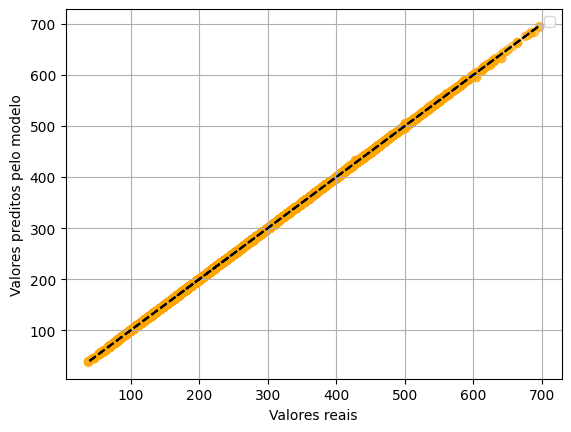

c:\Users\profr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
c:\Users\profr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
c:\Users\profr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
c:\Users\profr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
c:\Users\profr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warni

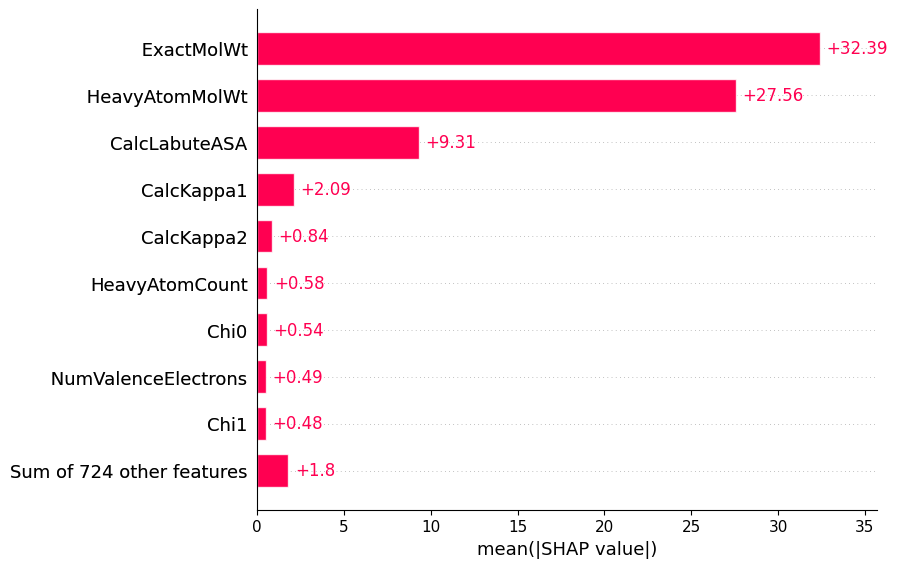

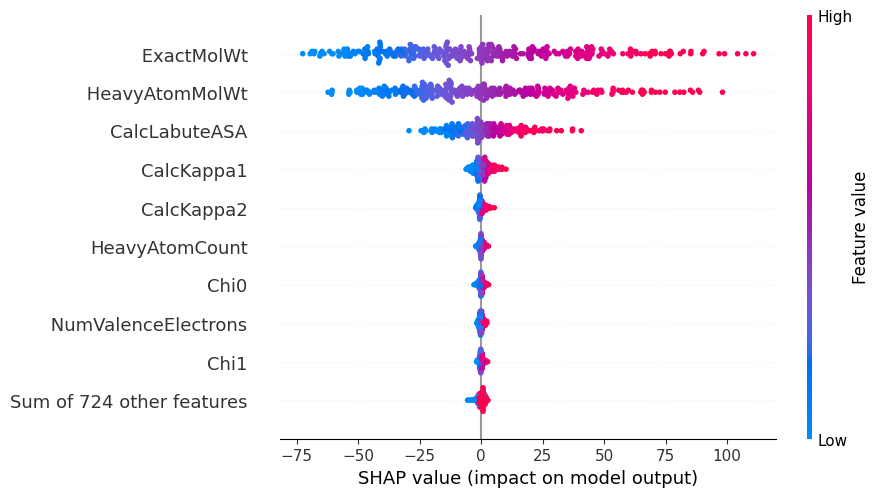

Start of training Sat Sep 28 11:20:23 2024
End of training Sat Sep 28 15:02:45 2024


In [8]:
##################### HOMO - ExtraTreesRegressor ####################
hiperParams = {'max_depth': 17, 'min_samples_leaf': 1, 'min_samples_split': 7, 'n_estimators': 400, 'random_state': 42}
ExtraTreesRegressorToAll(pa_list, HOMO,  hiperParams, 'orange')

150188
Cross Validation:::


Média do MSE: 0.055011836526714895
Média do MAE: 0.16311101013722332
Média do R²: 0.9445266606424617
Média do RMSE: 0.23454161254153374
Média do MAPE: 5.422061210000121
Fold 1: MSE = 0.05587618913527125, MAE = 0.1631892163536443, R² = 0.9434865225833031, RMSE = 0.23638144837374878, MAPE = 5.543165894873617
Fold 2: MSE = 0.054930566783288746, MAE = 0.16343938489761028, R² = 0.9452800948451549, RMSE = 0.23437270912648672, MAPE = 5.327588775887483
Fold 3: MSE = 0.05422875366158468, MAE = 0.1627044291604154, R² = 0.9448133644989269, RMSE = 0.23287068012436576, MAPE = 5.395428959239263


 Test model evaluation results:
MAE: 0.160963133975637
MSE: 0.0532584125268999
RMSE: 0.2307778423655527
R2: 0.9471150843769574
Training model evaluation results:
MAE: 0.1489477741937607
MSE: 0.04565361351142522
RMSE: 0.2136670622988607
R2: 0.9539660955271745


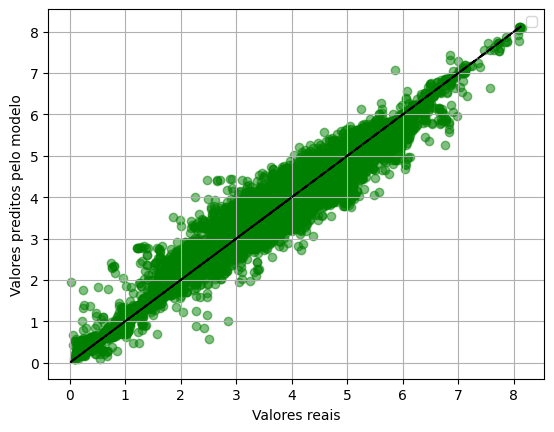

C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Py

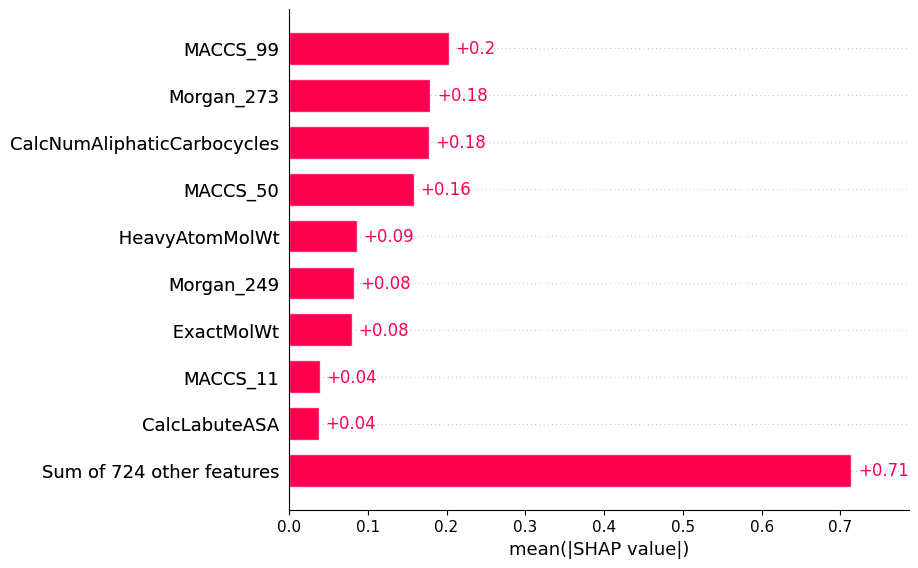

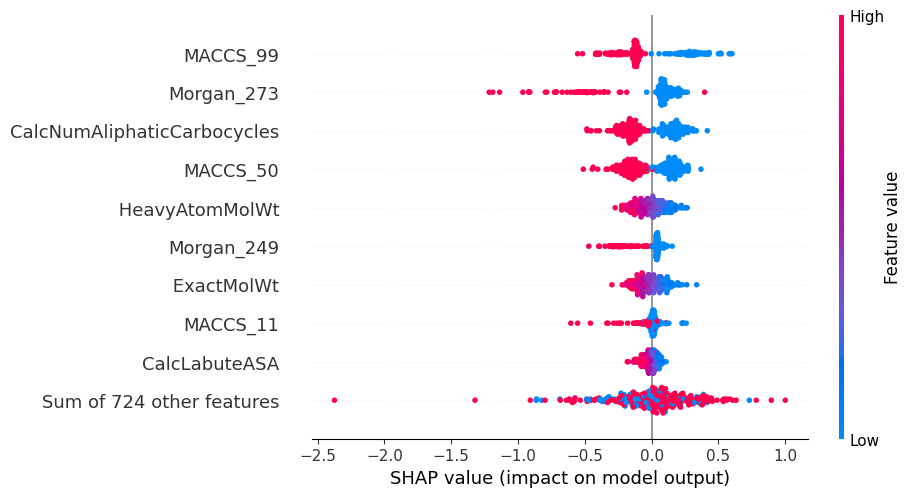

Start of training Wed Jun  5 15:06:42 2024
End of training Wed Jun  5 15:35:45 2024


In [72]:
##################### EE - ExtraTreesRegressor ####################
#X_train, X_test, y_train, y_test = train_test_split(pa_list, EE_list, test_size=0.3, random_state=200)
print(len(pa_list))
hiperParams = {'max_depth': 13, 'min_samples_leaf': 3, 'min_samples_split': 9, 'n_estimators': 100, 'random_state': 42}
ExtraTreesRegressorToAll(pa_list, EE_list, hiperParams, 'green')


Cross Validation:::




C:\Users\Usuário\AppData\Local\Temp\ipykernel_5316\2910311171.py:14: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
C:\Users\Usuário\AppData\Local\Temp\ipykernel_5316\2910311171.py:14: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
C:\Users\Usuário\AppData\Local\Temp\ipykernel_5316\2910311171.py:14: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


Média do MSE: 0.008833481284829166
Média do MAE: 0.04661611294490058
Média do R²: 0.9301562958189078
Média do RMSE: 0.09398434637109765
Média do MAPE: inf
Fold 1: MSE = 0.009005383007196159, MAE = 0.04679138244390848, R² = 0.9284949698688678, RMSE = 0.094896696503072, MAPE = inf
Fold 2: MSE = 0.008727387340991386, MAE = 0.04639710199039856, R² = 0.9307821609298003, RMSE = 0.09342048673064911, MAPE = inf
Fold 3: MSE = 0.008767673506299953, MAE = 0.0466598544003947, R² = 0.9311917566580555, RMSE = 0.09363585587957186, MAPE = inf


 Test model evaluation results:
MAE: 0.04485369068503066
MSE: 0.008601709002231492
RMSE: 0.09274539881973387
R2: 0.9313878645276017
Training model evaluation results:
MAE: 0.03435979579611714
MSE: 0.003965295488498003
RMSE: 0.06297059225144705
R2: 0.9686499069837612


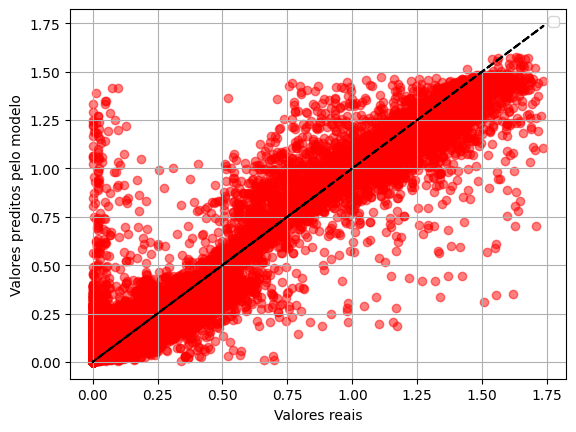

C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Py

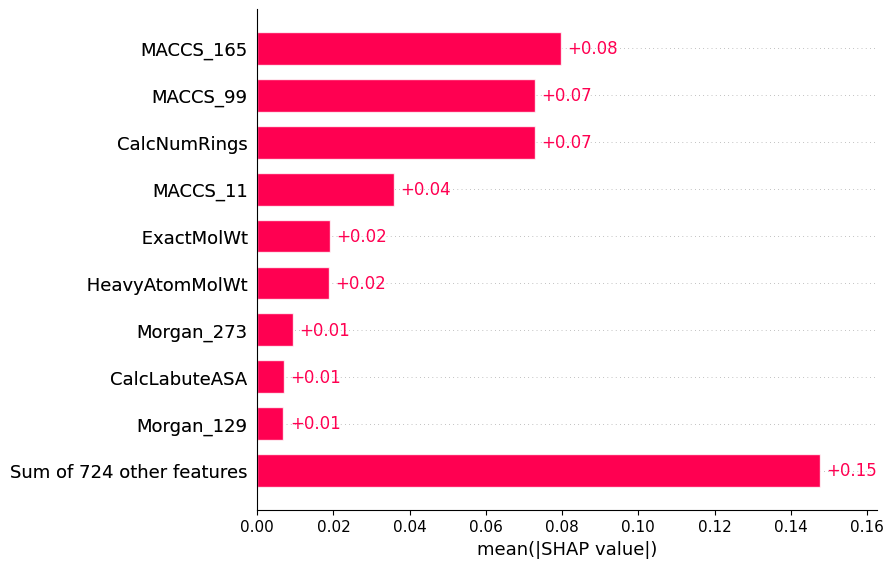

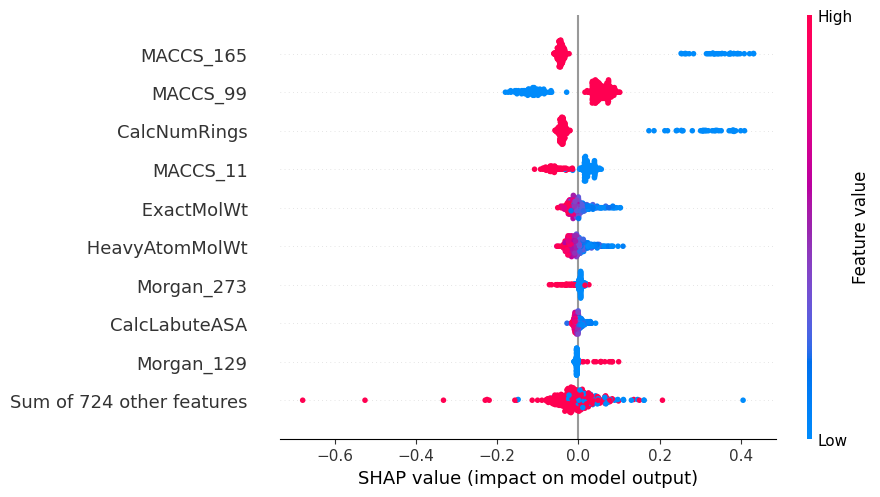

Start of training Wed Jun  5 15:35:45 2024
End of training Wed Jun  5 17:48:00 2024


In [73]:
##################### OS - ExtraTreesRegressor ####################
hiperParams = {'max_depth': 17, 'min_samples_leaf': 1, 'min_samples_split': 7, 'n_estimators': 400, 'random_state': 42}
ExtraTreesRegressorToAll(pa_list, OS_list, hiperParams, 'red')

Cross Validation:::


Média do MSE: 4.312493975525952
Média do MAE: 1.3477821727441235
Média do R²: 0.9995375066799878
Média do RMSE: 2.0766251480745956
Média do MAPE: 0.5056636991282069
Fold 1: MSE = 4.248386870631932, MAE = 1.3406202228097255, R² = 0.9995461913184522, RMSE = 2.061161534337358, MAPE = 0.5051001517861476
Fold 2: MSE = 4.3524706650861065, MAE = 1.3510450350731418, R² = 0.9995326089657924, RMSE = 2.086257574003293, MAPE = 0.5056870613460773
Fold 3: MSE = 4.336624390859817, MAE = 1.3516812603495025, R² = 0.9995337197557185, RMSE = 2.082456335883136, MAPE = 0.5062038842523957


 Test model evaluation results:
MAE: 1.275259724751637
MSE: 3.854069593250083
RMSE: 1.9631784415203022
R2: 0.9995892781643089
Training model evaluation results:
MAE: 0.8006647148336541
MSE: 1.3252606679538106
RMSE: 1.1511996646775964
R2: 0.9998578797467682


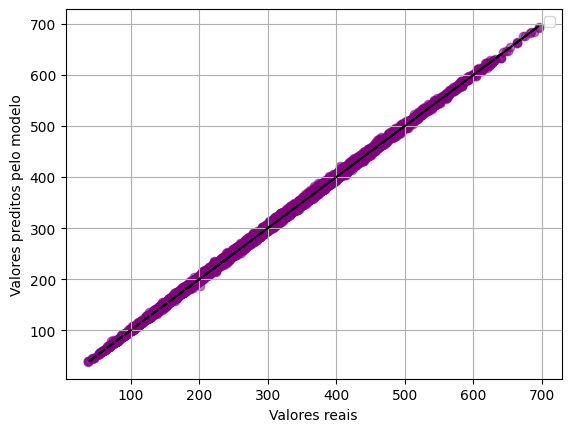

C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Py

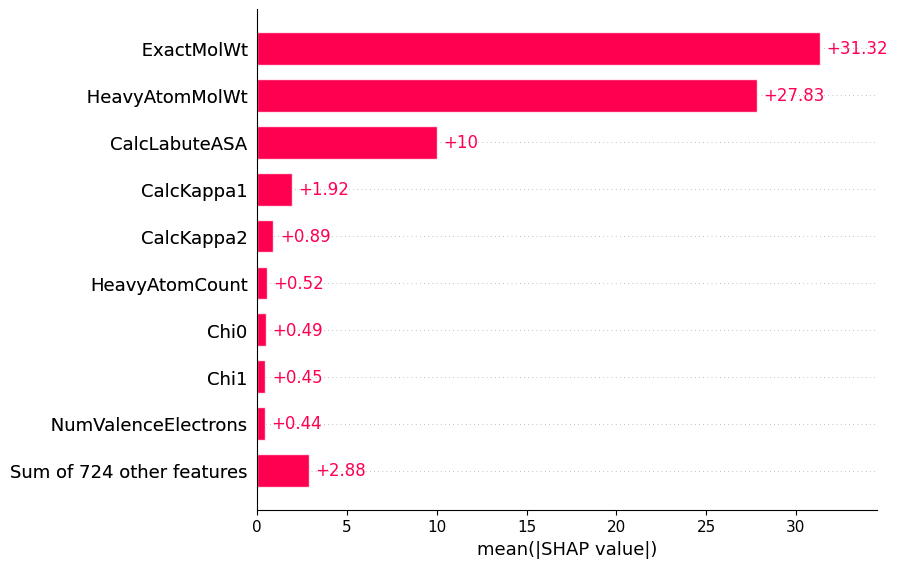

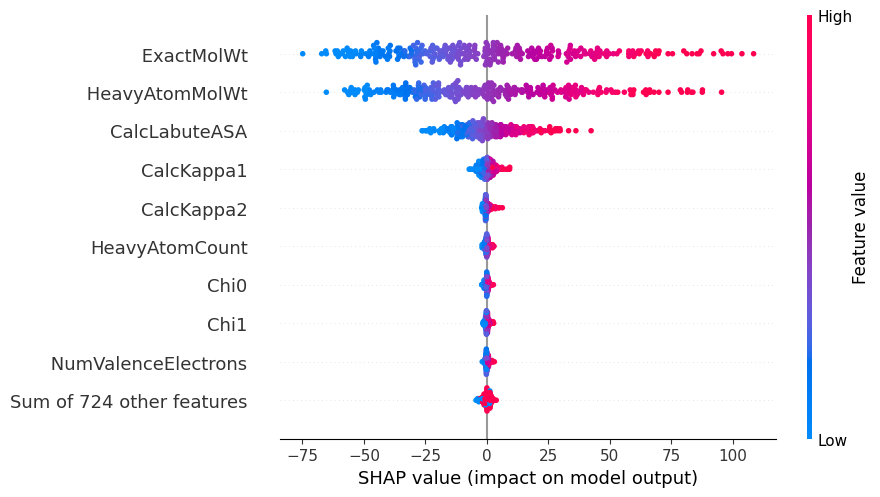

Start of training Wed Jun  5 17:48:00 2024
End of training Wed Jun  5 19:50:56 2024


In [74]:
##################### MO_i  - ExtraTreesRegressor ####################
hiperParams = {'max_depth': 17, 'min_samples_leaf': 1, 'min_samples_split': 7, 'n_estimators': 400, 'random_state': 42}
ExtraTreesRegressorToAll(pa_list, FO_list,  hiperParams, 'purple')

Cross Validation:::


Média do MSE: 1.486751938695825
Média do MAE: 0.7547508342318657
Média do R²: 0.9998426368454059
Média do RMSE: 1.219269696425785
Média do MAPE: 0.30677149588026387
Fold 1: MSE = 1.4642568729143584, MAE = 0.755146260140982, R² = 0.9998455782846758, RMSE = 1.2100648217820227, MAPE = 0.30884424227241186
Fold 2: MSE = 1.4694046403457113, MAE = 0.7464478475552917, R² = 0.9998442739999578, RMSE = 1.21219001825032, MAPE = 0.3019908827520947
Fold 3: MSE = 1.5265943028274056, MAE = 0.7626583949993238, R² = 0.9998380582515839, RMSE = 1.2355542492450122, MAPE = 0.3094793626162851


 Test model evaluation results:
MAE: 0.7220072810032203
MSE: 1.3155417858380951
RMSE: 1.1469706996423645
R2: 0.9998615944442922
Training model evaluation results:
MAE: 0.5405473004860621
MSE: 0.6467911017354372
RMSE: 0.8042332383925929
R2: 0.9999315450609944


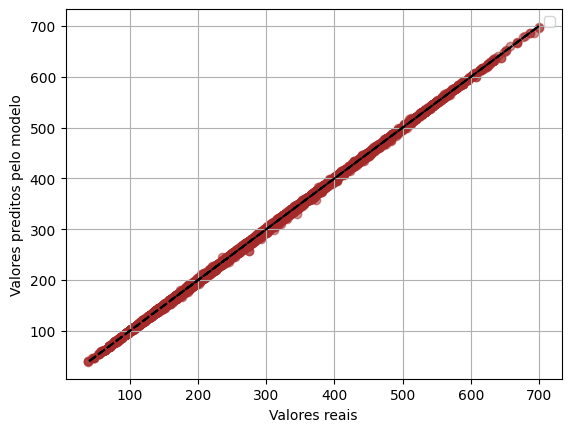

C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but ExtraTreesRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Py

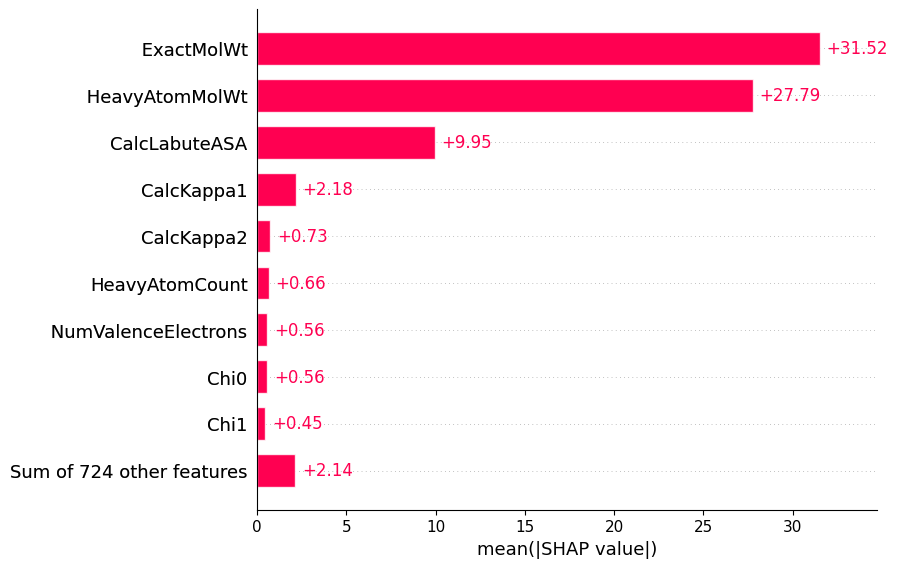

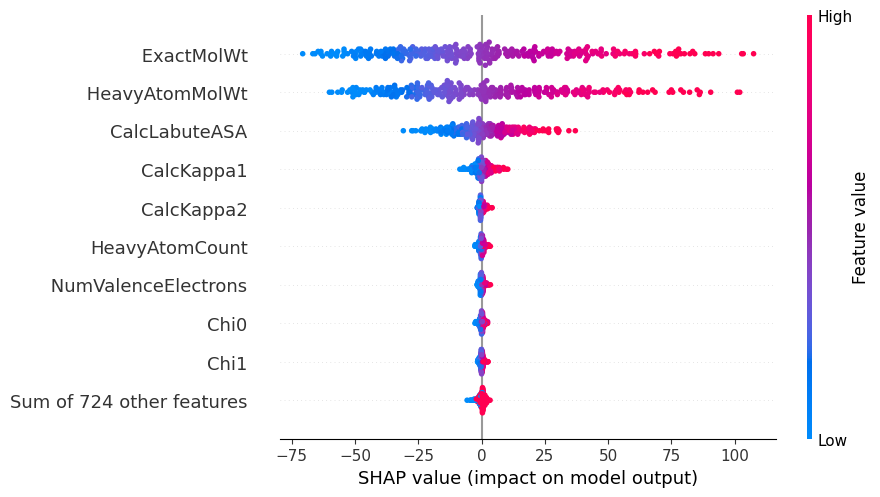

Start of training Wed Jun  5 19:50:56 2024
End of training Wed Jun  5 21:47:33 2024


In [75]:
##################### MO_f - ExtraTreesRegressor ####################
hiperParams = {'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 7, 'n_estimators': 400, 'random_state': 42}
ExtraTreesRegressorToAll(pa_list, SO_list, hiperParams, 'brown')


## Below we have the test with random forest

In [9]:
##################### func - RandomForestRegressor ####################
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve, train_test_split
from sklearn.ensemble import RandomForestRegressor
import time

def plot_learning_curve(estimator, title, X, y, cv=None, n_jobs=None, train_sizes=np.linspace(0.1, 1.0, 5), scoring='neg_mean_squared_error'):
    plt.figure()
    plt.title(title)
    plt.xlabel("Training examples")
    plt.ylabel("Loss (Negative MSE)")
    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=10, n_jobs=n_jobs, train_sizes=train_sizes, scoring=scoring)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training loss")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation loss")

    plt.legend(loc="best")
    return plt

def RandomForestRegressorToAll(pa, list, hiperParams, color):
    X_train, X_test, y_train, y_test = train_test_split(pa, list, test_size=0.3, random_state=200)
    inicio = time.ctime()

    regr = RandomForestRegressor(**hiperParams)

    try:
        ###------- CrossValidation -------###
        funcCrossValidation(regr, X_train, y_train)

        ###------- Testing Overfiting and final result -------###
        regr.fit(X_train, y_train)
        joblib.dump(regr, f'{color}_Random.pkl')
        
        y_pred = regr.predict(X_test)
        resultados = avaliar_modelo(y_test, y_pred)

        
        # print test results
        print("\n\n Test model evaluation results:")
        for metrica, valor in resultados.items():
            print(f"{metrica}: {valor}")

        y_pred2 = regr.predict(X_train)
        resultados = avaliar_modelo(y_train, y_pred2)

        # print training results
        print("Training model evaluation results:")
        for metrica, valor in resultados.items():
            print(f"{metrica}: {valor}")
        
        ###------- draw graph test -------###
        grafic(y_test, y_pred, color)
        ###------- Plot Learning Curve -------###
        title = "Learning Curves (RandomForestRegressor)"
        plot_learning_curve(regr, title, X_train, y_train, cv=10)
        plt.show()

        ###------- Shap - importances values -------###

        funcImportances(regr, X_test)

    except Exception as e:
        # print error
        print(f"Ocorreu um erro: {e}")

    print('Start of training', inicio)
    print('End of training', time.ctime())

Cross Validation:::


Média do MSE: 0.11702387168246314
Média do MAE: 0.061588520988674816
Média do R²: 0.9999875924043282
Média do RMSE: 0.3420577852954872
Média do MAPE: 0.02606053231728663
Fold 1: MAE = 0.06186579627281178, RMSE = 0.3395542359956184, MSE = 0.11529707918256812,  R² = 0.9999878201754598
Fold 2: MAE = 0.0609383072631069, RMSE = 0.3382288136920039, MSE = 0.1143987304115003,  R² = 0.9999878530918892
Fold 3: MAE = 0.06196145943010576, RMSE = 0.34839030619883926, MSE = 0.121375805453321,  R² = 0.9999871039456354


 Test model evaluation results:
MAE: 0.03674994276104108
MSE: 0.05943842956381075
RMSE: 0.24379997859682176
R2: 0.9999937367299184
MAPE: 0.01606230142889775
Training model evaluation results:
MAE: 0.016689046771474116
MSE: 0.014847816222813254
RMSE: 0.12185161559377558
R2: 0.9999984258289444
MAPE: 0.0070931501180972285


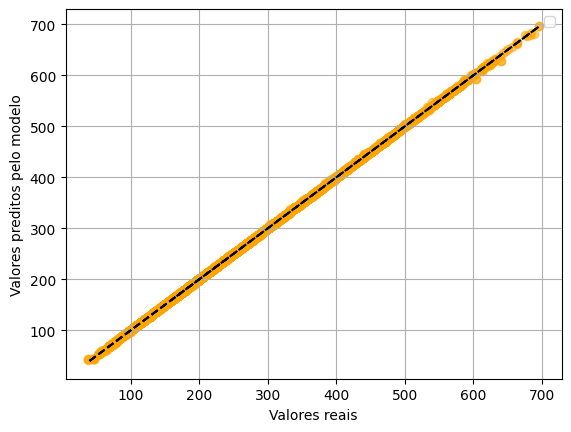

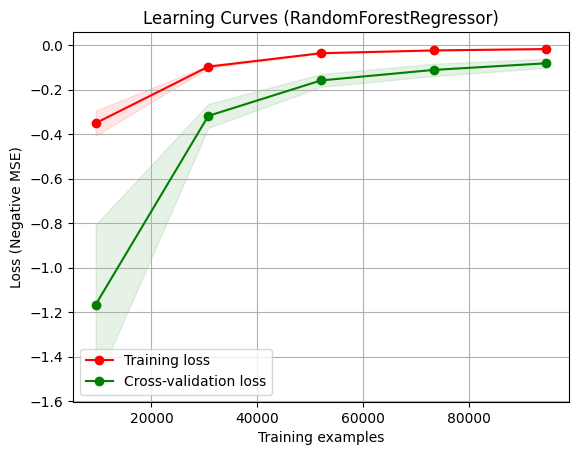

c:\Users\profr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
c:\Users\profr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
c:\Users\profr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
c:\Users\profr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
c:\Users\profr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature nam

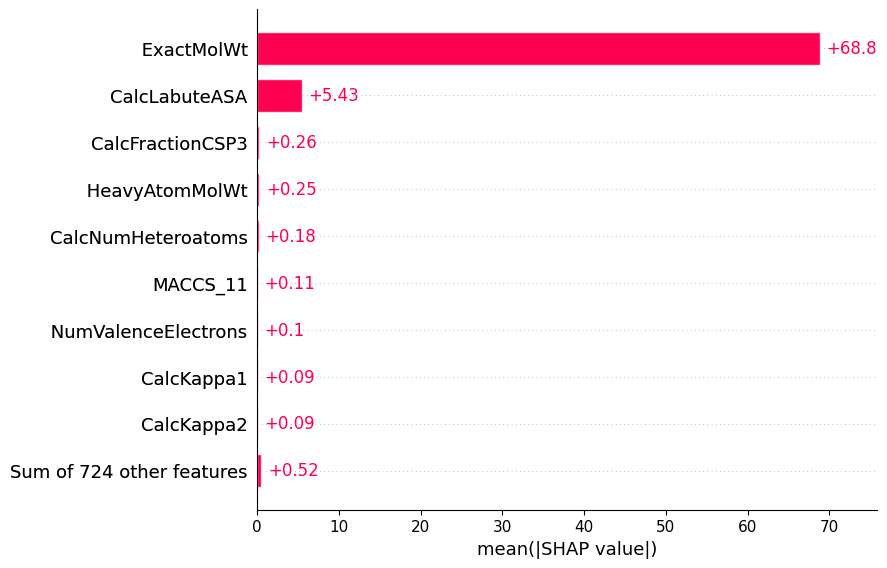

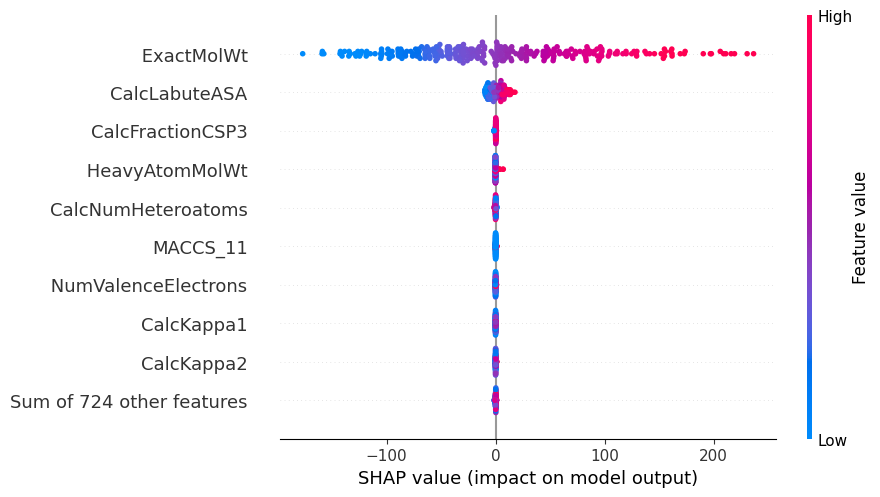

Start of training Sat Sep 28 15:02:46 2024
End of training Sat Sep 28 20:33:17 2024


In [10]:
##################### HOMO - Random Forest - ####################
hiperParams = {'max_leaf_nodes': 10000, 'min_samples_split': 7, 'n_estimators': 100, 'random_state': 42}
RandomForestRegressorToAll(pa_list, HOMO, hiperParams, 'orange')

Cross Validation:::


Média do MSE: 0.031053481900988233
Média do MAE: 0.1046220795024198
Média do R²: 0.9686811276230572
Média do RMSE: 0.1761961592829502
Média do MAPE: 3.5394601286349343
Fold 1: MSE = 0.03246472884227472, MAE = 0.10562311102671149, R² = 0.9671649991049774, RMSE = 0.1801797126267958, MAPE = 3.6363503115934814
Fold 2: MSE = 0.030058131987776036, MAE = 0.10375863722578167, R² = 0.9700571425379265, RMSE = 0.17337281213551345, MAPE = 3.391089857694516
Fold 3: MSE = 0.03063758487291393, MAE = 0.10448449025476625, R² = 0.9688212412262679, RMSE = 0.17503595308654143, MAPE = 3.590940216616806


 Test model evaluation results:
MAE: 0.09444610540005932
MSE: 0.02595756728980506
RMSE: 0.16111352298862147
R2: 0.9742244710127732
Training model evaluation results:
MAE: 0.051670291131738544
MSE: 0.006864248010632322
RMSE: 0.0828507574535823
R2: 0.9930785733506033


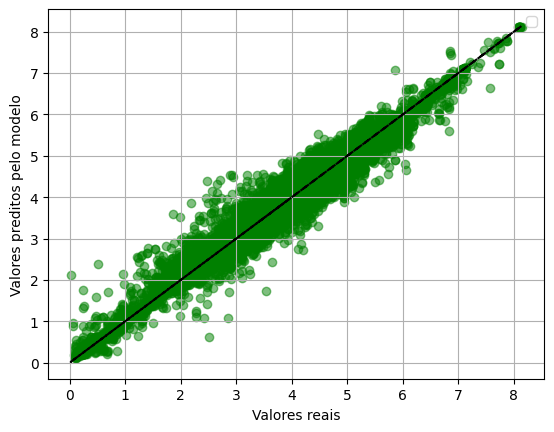

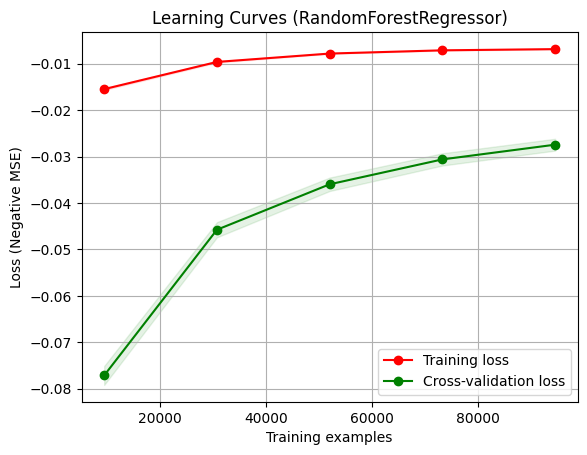

C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\

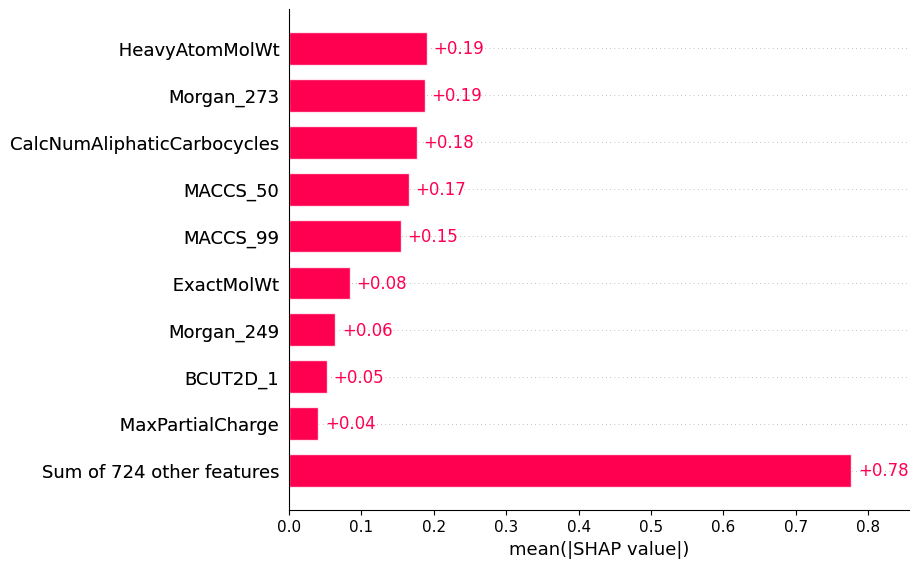

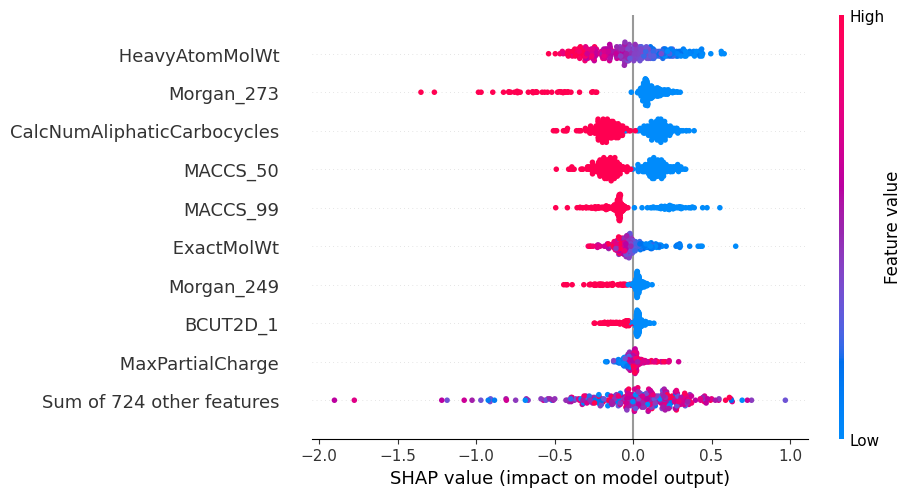

Start of training Wed Jun  5 21:47:34 2024
End of training Thu Jun  6 01:50:23 2024


In [77]:
##################### EE - Random Forest ####################
hiperParams = {'max_leaf_nodes': 10000, 'min_samples_split': 7, 'n_estimators': 100, 'random_state': 42}
RandomForestRegressorToAll(pa_list, EE_list, hiperParams, 'green')

Cross Validation:::




C:\Users\Usuário\AppData\Local\Temp\ipykernel_5316\2910311171.py:14: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
C:\Users\Usuário\AppData\Local\Temp\ipykernel_5316\2910311171.py:14: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
C:\Users\Usuário\AppData\Local\Temp\ipykernel_5316\2910311171.py:14: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


Média do MSE: 0.007912927217217479
Média do MAE: 0.03926793142754883
Média do R²: 0.9374342994585142
Média do RMSE: 0.08895314834073868
Média do MAPE: inf
Fold 1: MSE = 0.008041033372829444, MAE = 0.03919679230385954, R² = 0.9361521510911697, RMSE = 0.0896718092425342, MAPE = inf
Fold 2: MSE = 0.007866208771944673, MAE = 0.03912202049220787, R² = 0.9376122599358344, RMSE = 0.08869164995615243, MAPE = inf
Fold 3: MSE = 0.007831539506878317, MAE = 0.03948498148657907, R² = 0.938538487348539, RMSE = 0.08849598582352941, MAPE = inf


 Test model evaluation results:
MAE: 0.035575023403322206
MSE: 0.0072491490482261885
RMSE: 0.08514193472212261
R2: 0.9421766539152313
Training model evaluation results:
MAE: 0.01832233543301354
MSE: 0.001664080939902905
RMSE: 0.04079314819798669
R2: 0.9868435801559226


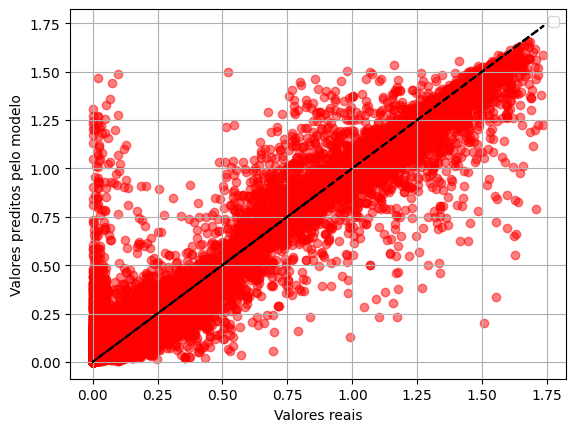

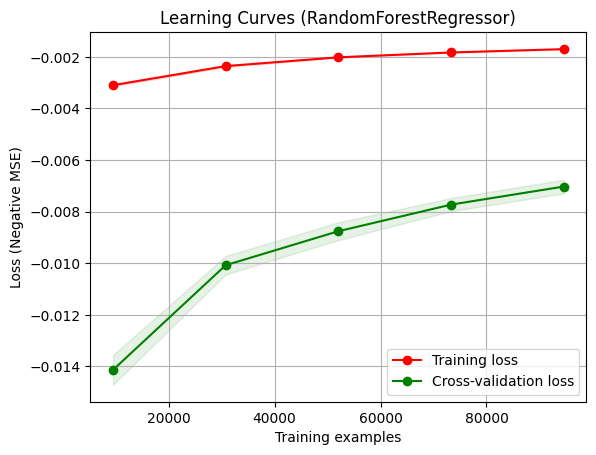

C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\

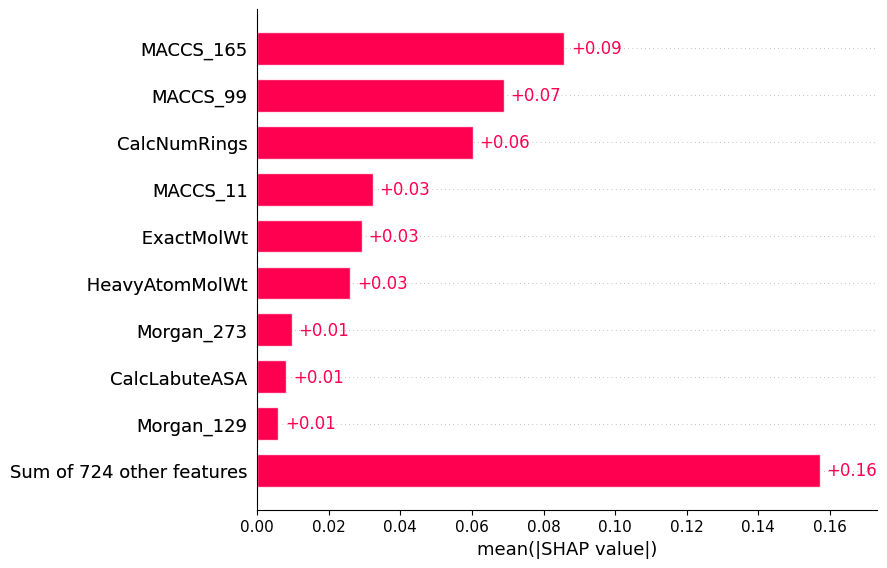

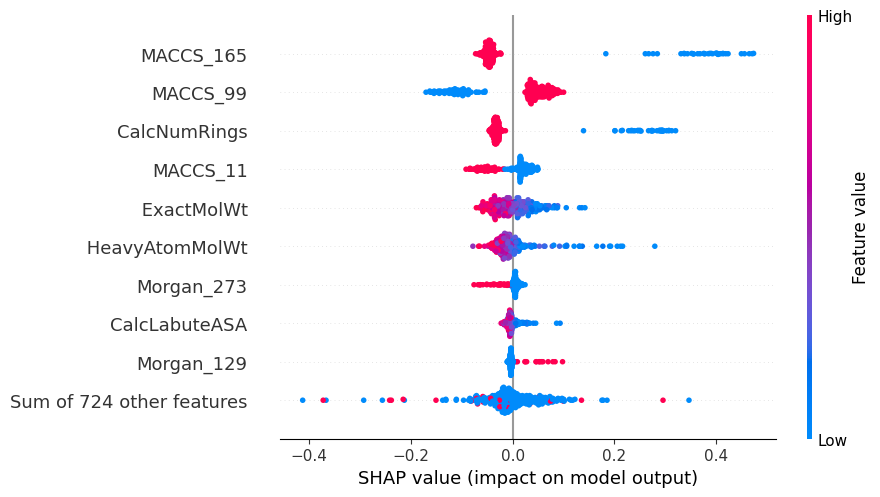

Start of training Thu Jun  6 01:50:23 2024
End of training Thu Jun  6 06:20:17 2024


In [78]:
##################### OS - Random Forest - ####################
hiperParams = {'max_leaf_nodes': 10000, 'min_samples_split': 7, 'n_estimators': 100, 'random_state': 42}
RandomForestRegressorToAll(pa_list, OS_list, hiperParams, 'red')

Cross Validation:::


Média do MSE: 4.3045564494640685
Média do MAE: 1.328647491326347
Média do R²: 0.9995383551468794
Média do RMSE: 2.074699447789596
Média do MAPE: 0.5003623144871393
Fold 1: MSE = 4.227040310797074, MAE = 1.3254803931776484, R² = 0.9995484715378553, RMSE = 2.055976729147748, MAPE = 0.5020765950328331
Fold 2: MSE = 4.352700720933952, MAE = 1.333033802300725, R² = 0.9995325842611938, RMSE = 2.0863127092873572, MAPE = 0.5006142170385675
Fold 3: MSE = 4.333928316661178, MAE = 1.327428278500668, R² = 0.9995340096415889, RMSE = 2.0818089049336823, MAPE = 0.49839613139001726


 Test model evaluation results:
MAE: 1.2383429714915979
MSE: 3.76474849651383
RMSE: 1.940295981677494
R2: 0.9995987969661702
Training model evaluation results:
MAE: 0.6850138209245823
MSE: 0.9983037189142696
RMSE: 0.999151499480569
R2: 0.9998929424370879


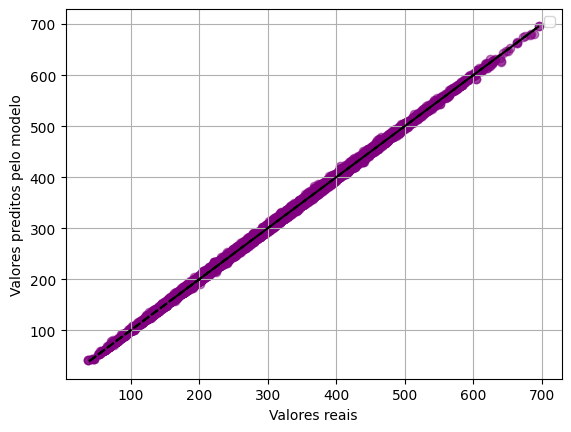

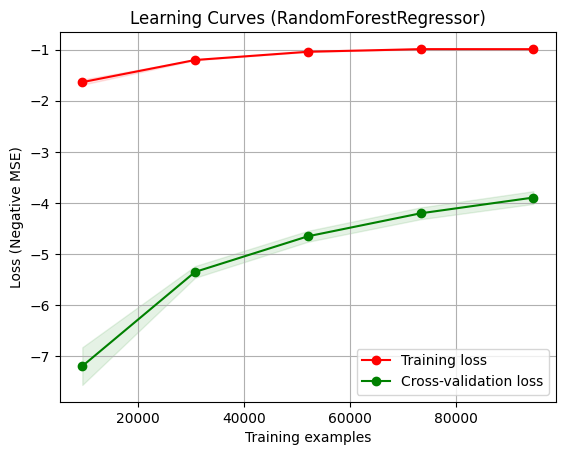

C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\

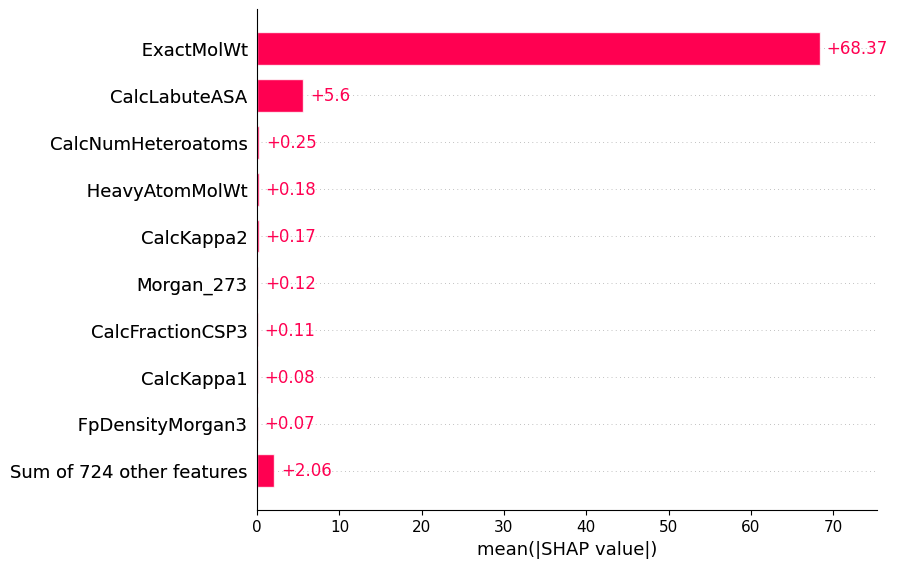

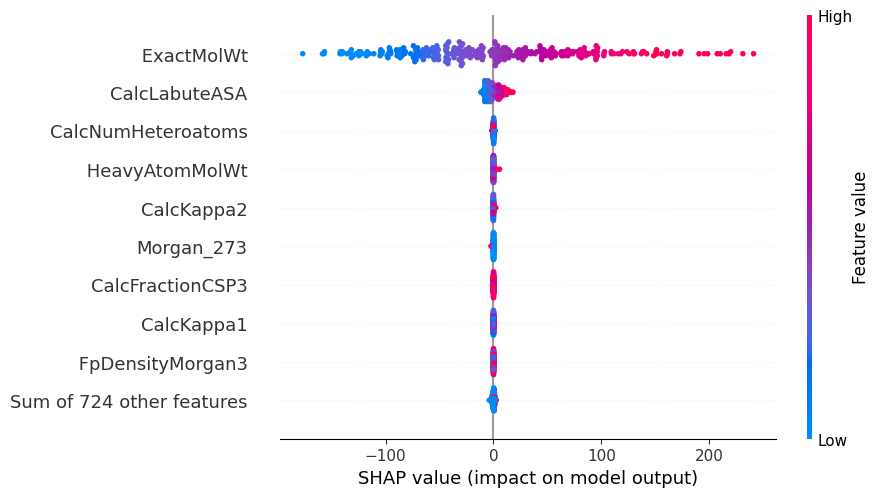

Start of training Thu Jun  6 06:20:17 2024
End of training Thu Jun  6 10:10:44 2024


In [79]:
##################### MO_i - Random Forest - ####################
hiperParams = {'max_leaf_nodes': 10000, 'min_samples_split': 7, 'n_estimators': 100, 'random_state': 42}
RandomForestRegressorToAll(pa_list, FO_list, hiperParams, 'purple')

Cross Validation:::


Média do MSE: 1.4820765878560485
Média do MAE: 0.6927716001794968
Média do R²: 0.9998431315072147
Média do RMSE: 1.2173643625640935
Média do MAPE: 0.2829709030833227
Fold 1: MSE = 1.457271637433735, MAE = 0.6930177420227016, R² = 0.999846314953265, RMSE = 1.2071750649486324, MAPE = 0.2849500823720252
Fold 2: MSE = 1.4735855851215989, MAE = 0.6907804516929452, R² = 0.9998438309077091, RMSE = 1.2139133350950548, MAPE = 0.2811013103846539
Fold 3: MSE = 1.5153725410128116, MAE = 0.6945166068228437, R² = 0.9998392486606699, RMSE = 1.2310046876485936, MAPE = 0.282861316493289


 Test model evaluation results:
MAE: 0.6219441804020985
MSE: 1.227595664248384
RMSE: 1.1079691621378205
R2: 0.999870847082226
Training model evaluation results:
MAE: 0.310741409887031
MSE: 0.32467994337253664
RMSE: 0.5698069351741313
R2: 0.9999656365932366


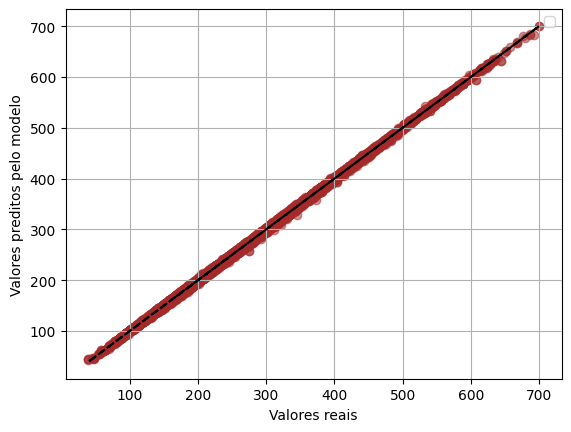

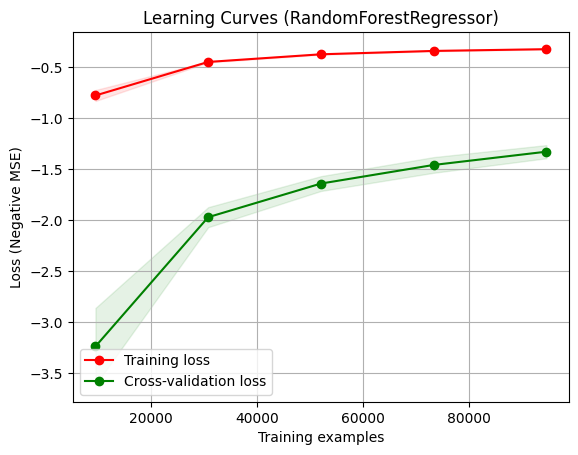

C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
C:\Users\Usuário\AppData\

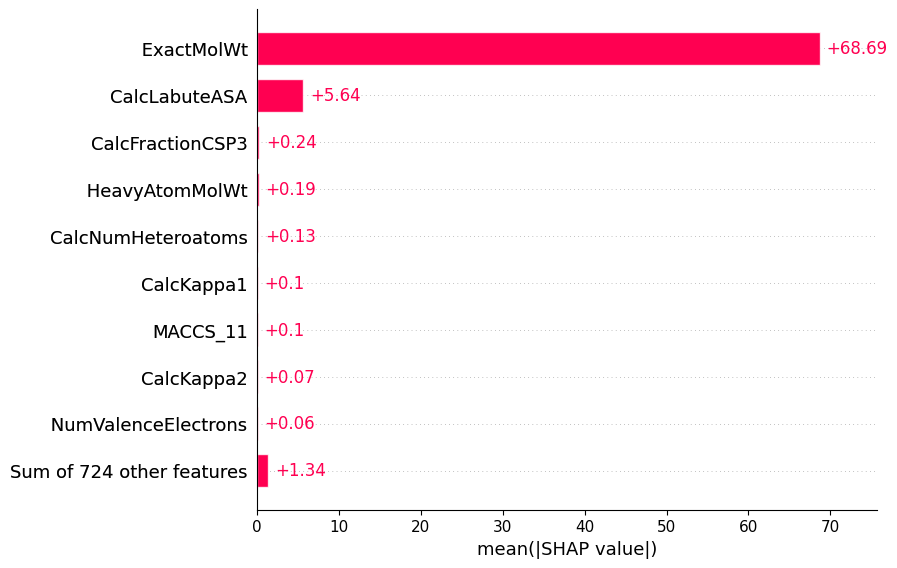

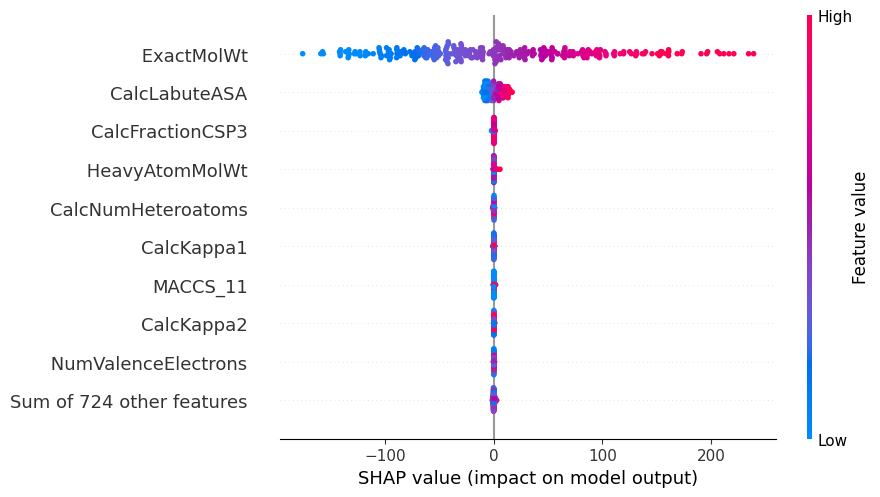

Start of training Thu Jun  6 10:10:44 2024
End of training Thu Jun  6 13:51:40 2024


In [80]:
##################### MO_f - Random Forest - ####################
hiperParams = {'max_leaf_nodes': 10000, 'min_samples_split': 7, 'n_estimators': 100, 'random_state': 42}
RandomForestRegressorToAll(pa_list, SO_list, hiperParams, 'brown')

## Below we have the test with XGB

In [11]:
##################### func - XGB ####################

def funcXGB(pa, list, hiperParams, color):
    X_train, X_test, y_train, y_test = train_test_split(pa, list, test_size=0.3, random_state=200)
    inicio = time.ctime()

    regr = regr = xgb.XGBRegressor(**hiperParams)

    try:
        ###------- CrossValidation -------###
        funcCrossValidation(regr, X_train, y_train)

        ###------- Testing Overfiting and final result -------###
        regr.fit(X_train, y_train)
        joblib.dump(regr, f'{color}_XGB_model.pkl')

        y_pred = regr.predict(X_test)
        resultados = avaliar_modelo(y_test, y_pred)

        
        # print test results
        print("\n\n Test model evaluation results:")
        for metrica, valor in resultados.items():
            print(f"{metrica}: {valor}")

        y_pred2 = regr.predict(X_train)
        resultados = avaliar_modelo(y_train, y_pred2)

        # print training results
        print("Training model evaluation results:")
        for metrica, valor in resultados.items():
            print(f"{metrica}: {valor}")
        
        ###------- draw graph test -------###
        grafic(y_test, y_pred, color)
        

        ###------- Shap - importances values -------###

        funcImportances(regr, X_test)
    except Exception as e:
        # print error
        print(f"Ocorreu um erro: {e}")

    print('Start of training', inicio)
    print('End of training', time.ctime())

    

Cross Validation:::


Média do MSE: 1.6586706521261412
Média do MAE: 0.6262082173484368
Média do R²: 0.9998241354437899
Média do RMSE: 1.2873672751994956
Média do MAPE: 0.24866825279947966
Fold 1: MAE = 0.6299232041613994, RMSE = 1.2772609502936585, MSE = 1.6313955351450597,  R² = 0.9998276616240883
Fold 2: MAE = 0.6208920897366371, RMSE = 1.2481754045410676, MSE = 1.557941840501258,  R² = 0.9998345770419785
Fold 3: MAE = 0.6278093581472742, RMSE = 1.3366654707637604, MSE = 1.7866745807321052,  R² = 0.9998101676653032


 Test model evaluation results:
MAE: 0.607888092691911
MSE: 1.538665779006691
RMSE: 1.2404296751556256
R2: 0.9998378645026471
MAPE: 0.239747903740437
Training model evaluation results:
MAE: 0.5561074209191033
MSE: 0.7431573681384989
RMSE: 0.8620657562729764
R2: 0.9999212101765559
MAPE: 0.22577976429530722


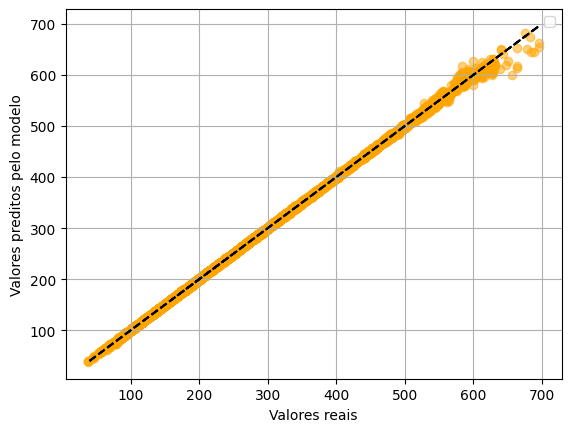

PermutationExplainer explainer: 301it [04:06,  1.18it/s]                         


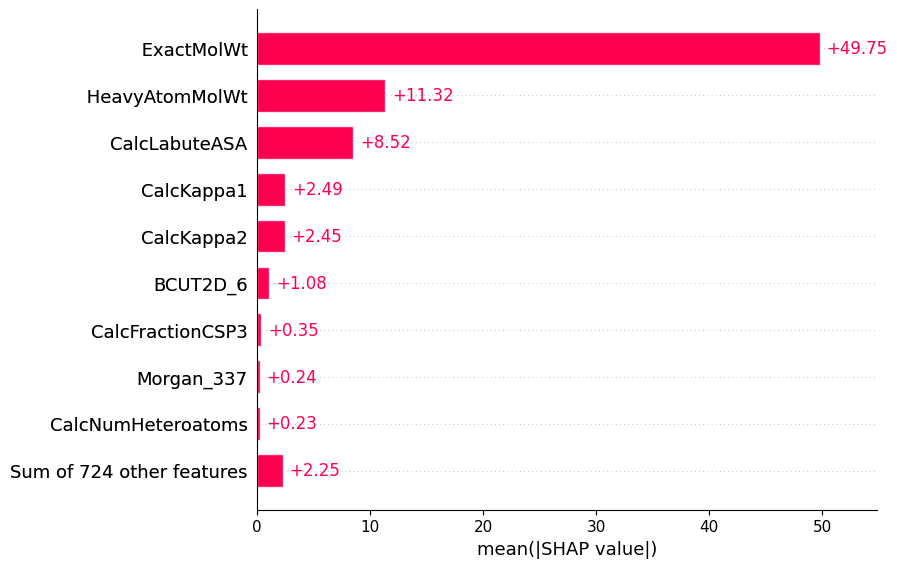

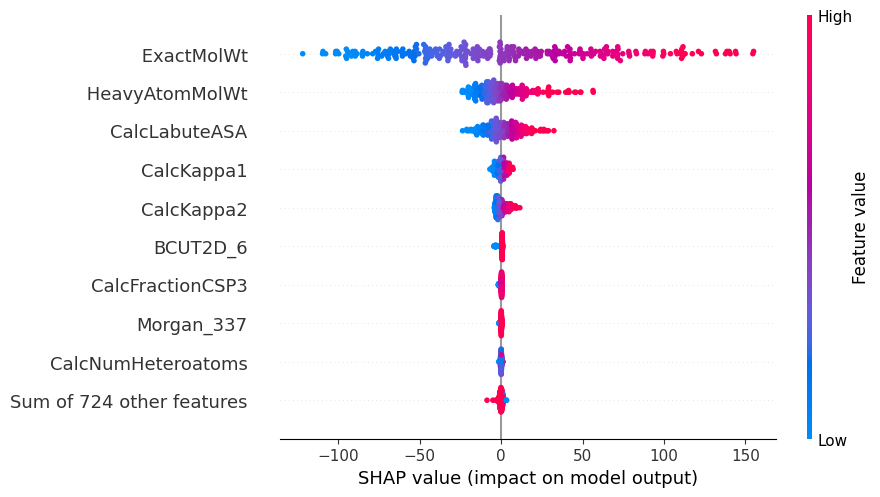

Start of training Sat Sep 28 20:33:18 2024
End of training Sat Sep 28 20:39:42 2024


In [12]:
##################### HOMO - XGB ####################
hiperParams = {'colsample_bytree': 0.7, 'gamma': 0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 400, 'reg_alpha': 1.0, 'reg_lambda': 1.0, 'subsample': 1.0}
funcXGB(pa_list, HOMO, hiperParams, 'orange')

Cross Validation:::


Média do MSE: 0.05152740159145005
Média do MAE: 0.16653855175171653
Média do R²: 0.9480402693258602
Média do RMSE: 0.22698932271396757
Média do MAPE: 6.05817310187332
Fold 1: MSE = 0.05260156365065843, MAE = 0.1674069338533412, R² = 0.9467984963638484, RMSE = 0.2293503077186914, MAPE = 6.205403566560448
Fold 2: MSE = 0.05136621198483535, MAE = 0.16670632129855603, R² = 0.9488307801544665, RMSE = 0.2266411524521426, MAPE = 5.977301024296084
Fold 3: MSE = 0.05061442913885636, MAE = 0.16550240010325235, R² = 0.9484915314592658, RMSE = 0.22497650797106875, MAPE = 5.991814714763428


 Test model evaluation results:
MAE: 0.16598486163054074
MSE: 0.051064538782160995
RMSE: 0.22597464190072522
R2: 0.9492935726640336
Training model evaluation results:
MAE: 0.15653363706100862
MSE: 0.0448684893420194
RMSE: 0.2118218339596261
R2: 0.9547577597183274


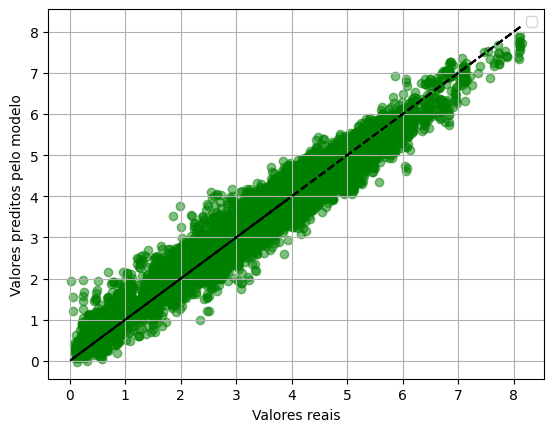

PermutationExplainer explainer: 301it [01:44,  2.62it/s]                         


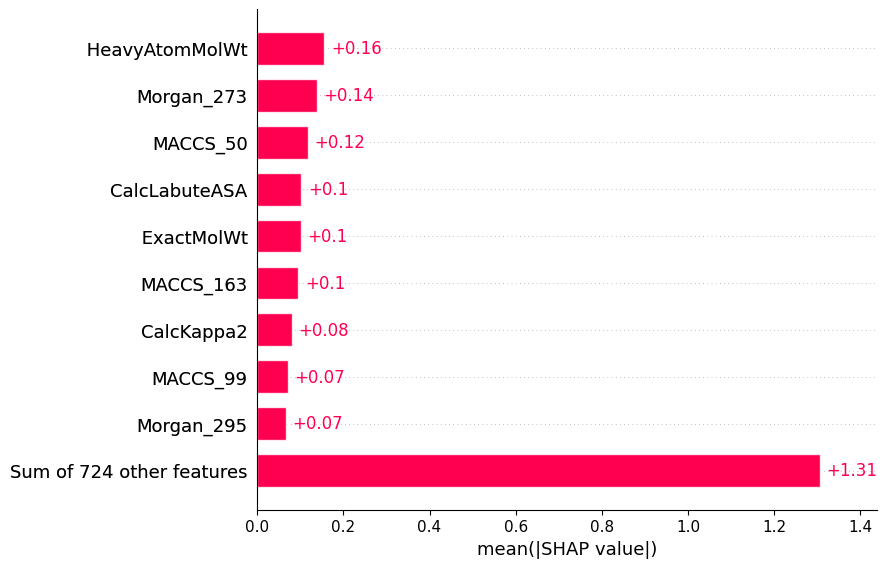

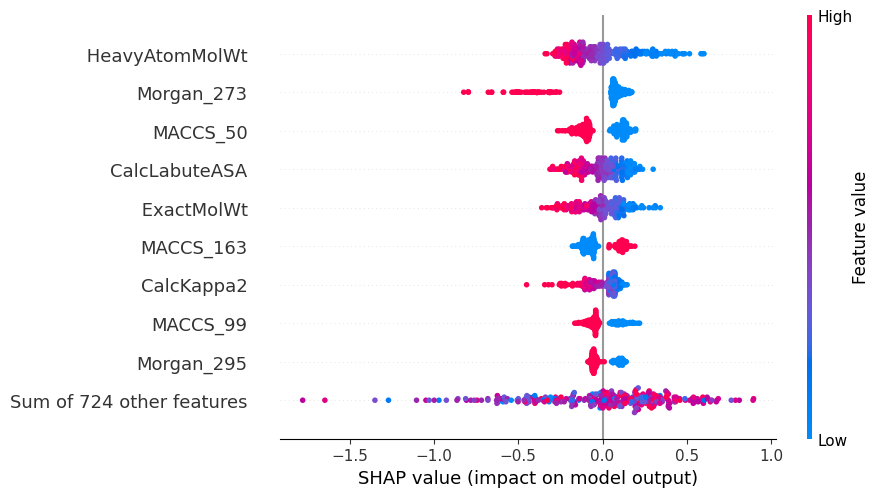

Start of training Thu Jun  6 13:51:40 2024
End of training Thu Jun  6 13:53:48 2024


In [82]:
##################### EE - XGB ####################
hiperParams = {'colsample_bytree': 0.7, 'gamma': 0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 400, 'reg_alpha': 1.0, 'reg_lambda': 1.0, 'subsample': 1.0}
funcXGB(pa_list, EE_list, hiperParams, 'green')

Cross Validation:::




C:\Users\Usuário\AppData\Local\Temp\ipykernel_5316\2910311171.py:14: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
C:\Users\Usuário\AppData\Local\Temp\ipykernel_5316\2910311171.py:14: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
C:\Users\Usuário\AppData\Local\Temp\ipykernel_5316\2910311171.py:14: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


Média do MSE: 0.01085423785507767
Média do MAE: 0.05933212382228389
Média do R²: 0.9141771061214624
Média do RMSE: 0.10417998804864692
Média do MAPE: inf
Fold 1: MSE = 0.01111311974649462, MAE = 0.05971944757909873, R² = 0.9117590043989265, RMSE = 0.105418782702584, MAPE = inf
Fold 2: MSE = 0.010731210132426339, MAE = 0.05920123518903536, R² = 0.9148896288255718, RMSE = 0.10359155434892528, MAPE = inf
Fold 3: MSE = 0.010718383686312045, MAE = 0.05907568869871756, R² = 0.915882685139889, RMSE = 0.1035296270944315, MAPE = inf


 Test model evaluation results:
MAE: 0.05885326444725637
MSE: 0.010809344641780093
RMSE: 0.10396799816183869
R2: 0.9137785039301777
Training model evaluation results:
MAE: 0.05504450892976788
MSE: 0.008767106836073757
RMSE: 0.0936328299052942
R2: 0.9306862210921073


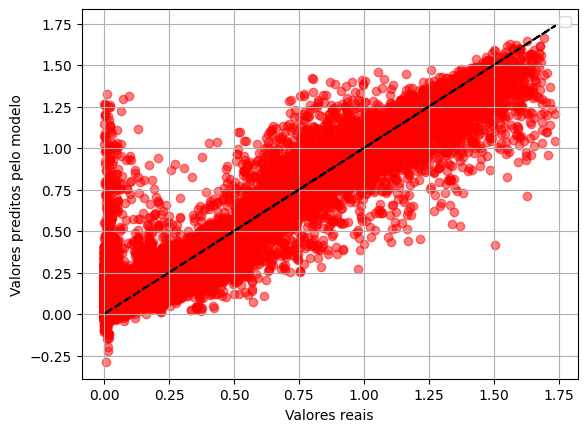

PermutationExplainer explainer: 301it [01:44,  2.61it/s]                         


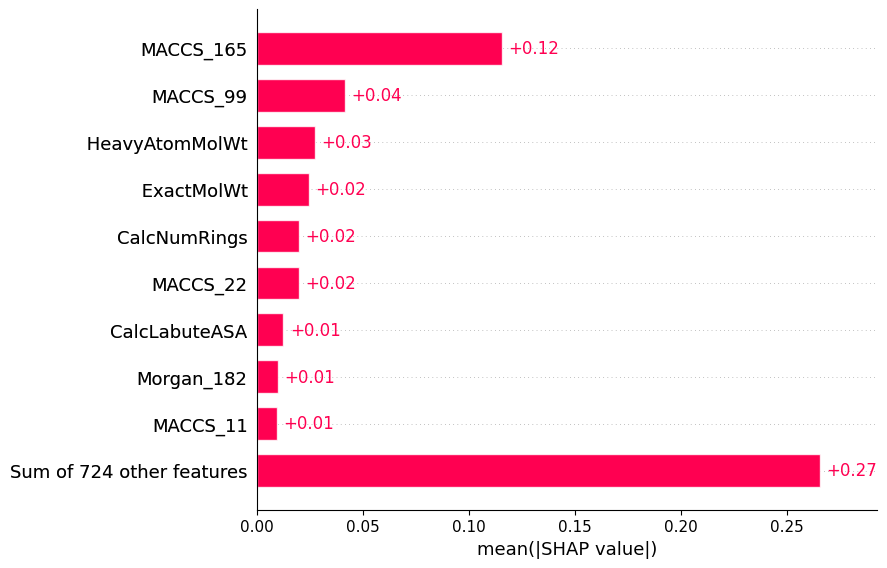

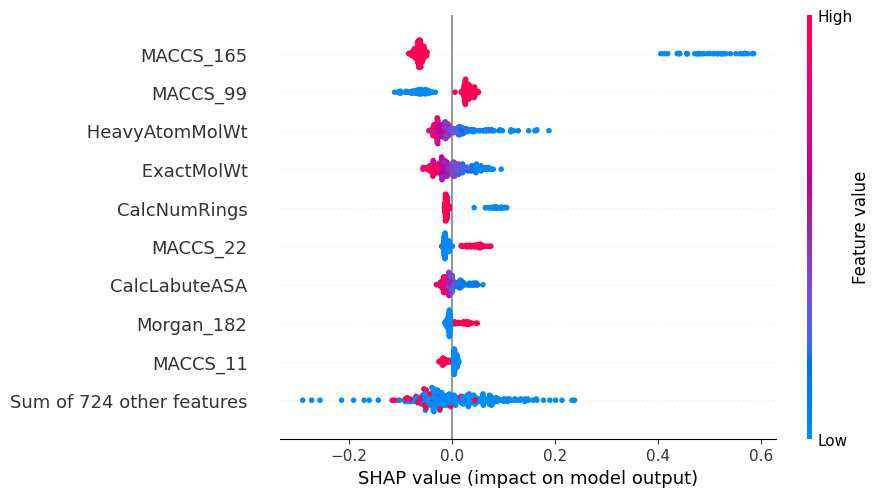

Start of training Thu Jun  6 13:53:49 2024
End of training Thu Jun  6 13:55:56 2024


In [83]:
##################### OS - XGB ####################
hiperParams = {'colsample_bytree': 0.7, 'gamma': 0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 400, 'reg_alpha': 1.0, 'reg_lambda': 1.0, 'subsample': 1.0}
funcXGB(pa_list, OS_list, hiperParams, 'red')

Cross Validation:::


Média do MSE: 5.880015414255825
Média do MAE: 1.6345066392762655
Média do R²: 0.9993693750206146
Média do RMSE: 2.4246449012844615
Média do MAPE: 0.6371498018515197
Fold 1: MSE = 5.7168411901706735, MAE = 1.6311137328176735, R² = 0.9993893324120118, RMSE = 2.3909916750525655, MAPE = 0.6359640457720486
Fold 2: MSE = 5.8218299841222745, MAE = 1.63495428509642, R² = 0.9993748214872332, RMSE = 2.4128468629654627, MAPE = 0.6381137556130818
Fold 3: MSE = 6.101375068474528, MAE = 1.637451899914703, R² = 0.9993439711625989, RMSE = 2.4700961658353564, MAPE = 0.6373716041694287


 Test model evaluation results:
MAE: 1.625377517619934
MSE: 5.83602799461523
RMSE: 2.4157872411732018
R2: 0.9993780641285537
Training model evaluation results:
MAE: 1.5141622202236125
MSE: 4.46199536467397
RMSE: 2.11234357164595
R2: 0.9995214979766012


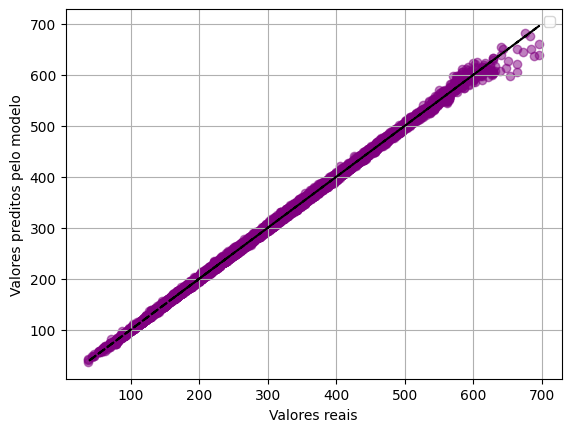

PermutationExplainer explainer: 301it [01:43,  2.62it/s]                         


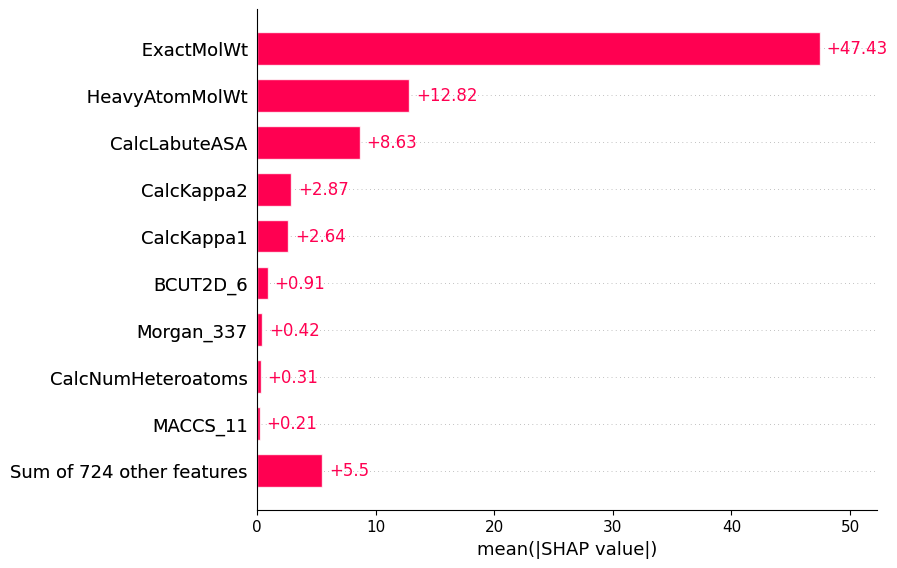

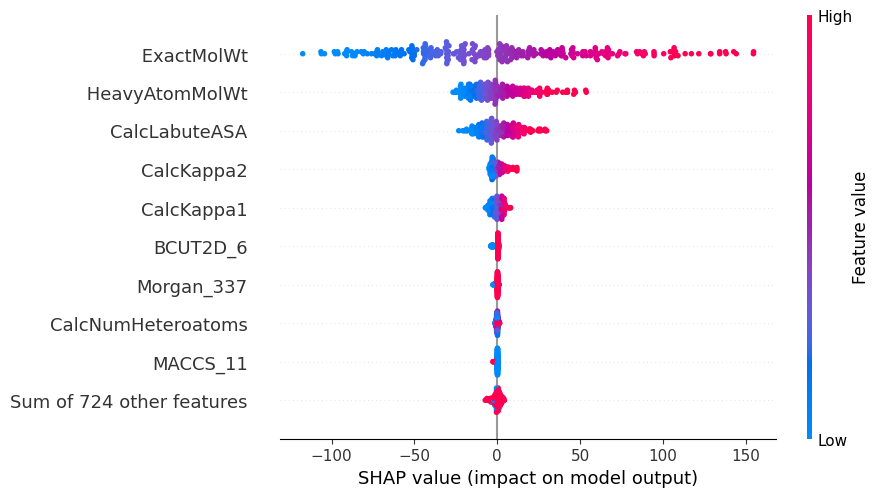

Start of training Thu Jun  6 13:55:56 2024
End of training Thu Jun  6 13:58:06 2024


In [84]:
##################### MO_i - XGB ####################
hiperParams = {'colsample_bytree': 0.7, 'gamma': 0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 400, 'reg_alpha': 1.0, 'reg_lambda': 1.0, 'subsample': 1.0}
funcXGB(pa_list, FO_list, hiperParams, 'purple')

Cross Validation:::


Média do MSE: 3.107895629780256
Média do MAE: 1.0862714031615386
Média do R²: 0.9996710320938981
Média do RMSE: 1.7624281188846218
Média do MAPE: 0.4366459361779753
Fold 1: MSE = 2.986495533801683, MAE = 1.0832790953426408, R² = 0.9996850417630481, RMSE = 1.7281480069142465, MAPE = 0.4342497067811836
Fold 2: MSE = 3.020440294218539, MAE = 1.0920708979282352, R² = 0.9996798968286406, RMSE = 1.737941395507495, MAPE = 0.4403409006732314
Fold 3: MSE = 3.3167510613205473, MAE = 1.0834642162137396, R² = 0.9996481576900056, RMSE = 1.8211949542321237, MAPE = 0.4353472010795109


 Test model evaluation results:
MAE: 1.0691302766610915
MSE: 3.0156954944820415
RMSE: 1.7365757957780137
R2: 0.9996827246270302
Training model evaluation results:
MAE: 0.9933485130240899
MSE: 2.03688736932353
RMSE: 1.4271956310623748
R2: 0.9997844203480006


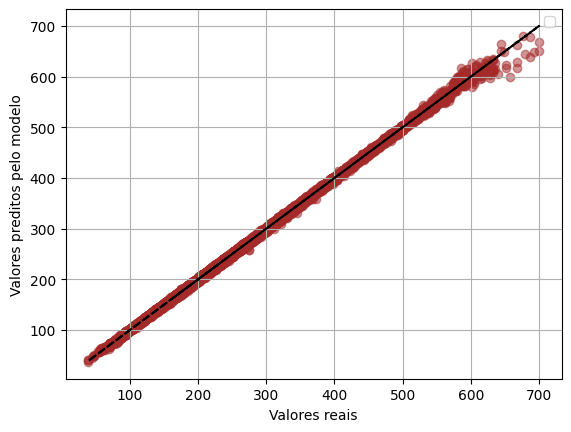

PermutationExplainer explainer: 301it [01:44,  2.59it/s]                         


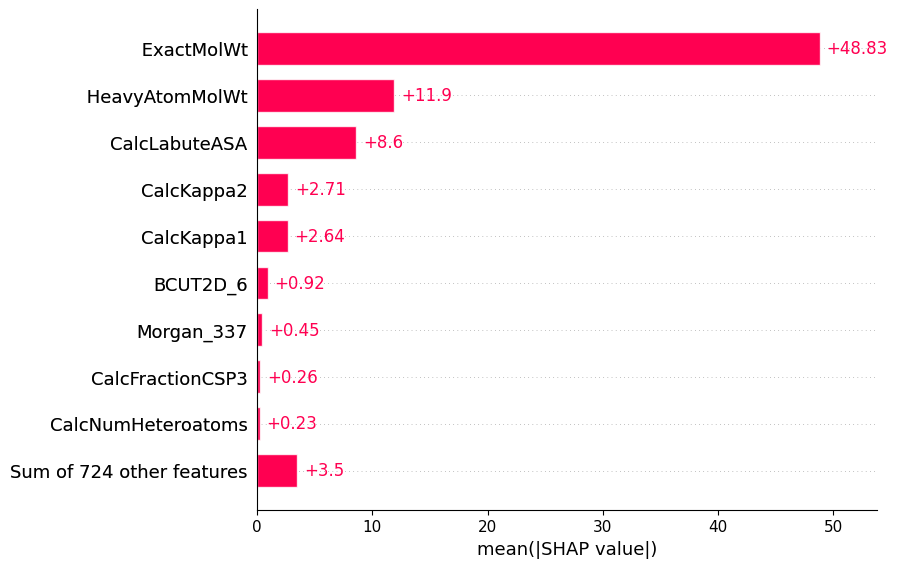

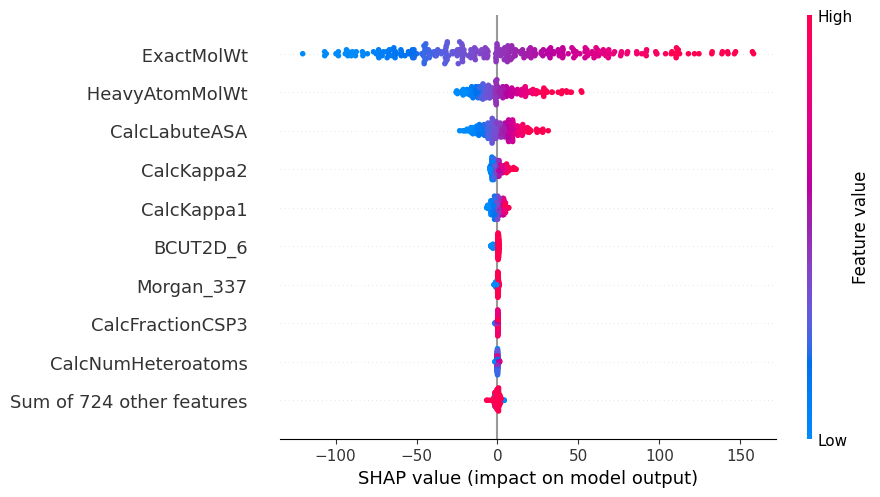

Start of training Thu Jun  6 13:58:07 2024
End of training Thu Jun  6 14:00:17 2024


In [85]:
##################### MO_f - XGB ####################
hiperParams = {'colsample_bytree': 0.7, 'gamma': 0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 400, 'reg_alpha': 1.0, 'reg_lambda': 1.0, 'subsample': 1.0}
funcXGB(pa_list, SO_list, hiperParams, 'brown')

RNA

Start of training Sat Sep 28 21:55:40 2024
150188


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6 (Dense)                 │ (None, 16)             │        11,744 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,889 (46.44 KB)

 Trainable params: 11,889 (46.44 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 44s 1ms/step - loss: 4.0461 - mean_squared_error: 510.6582 - val_loss: 1.7627 - val_mean_squared_error: 3.3248
Epoch 2/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 43s 1ms/step - loss: 0.9924 - mean_squared_error: 1.6867 - val_loss: 2.1092 - val_mean_squared_error: 4.7305
Epoch 3/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 38s 964us/step - loss: 0.9177 - mean_squared_error: 1.4606 - val_loss: 0.8174 - val_mean_squared_error: 1.0299
Epoch 4/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 42s 1ms/step - loss: 0.8286 - mean_squared_error: 1.1882 - val_loss: 0.5668 - val_mean_squared_error: 0.4187
Epoch 5/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 40s 1ms/step - loss: 0.7870 - mean_squared_error: 1.0656 - val_loss: 0.3719 - val_mean_squared_error: 0.2146
Epoch 6/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 37s 950us/step - loss: 0.7370 - mean_squared_error: 0.9441 - val_loss: 0.3126 - val_mean_squared_error: 0.1485
Epoch 7/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 41s 1ms/step - loss: 0.6626 - me

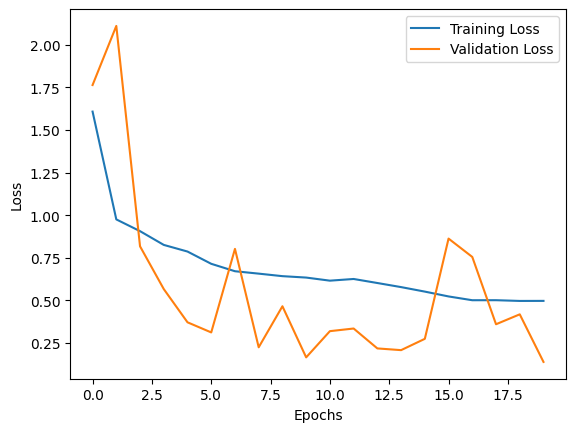

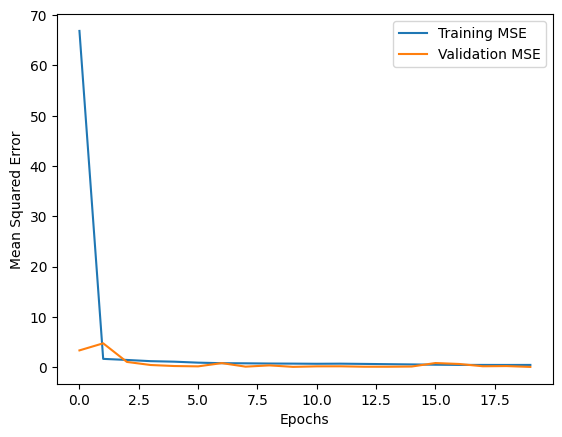

1409/1409 ━━━━━━━━━━━━━━━━━━━━ 1s 710us/step
45057
Resultados da avaliação do modelo de teste:
MAE: 0.013693765674589964
MSE: 0.018487693366180617
RMSE: 0.13596945747549563
R2: 0.9999980518762426
2464/2464 ━━━━━━━━━━━━━━━━━━━━ 2s 661us/step
Resultados da avaliação do modelo de treinamento:
MAE: 0.13862379047680984
MSE: 0.037253088188562516
RMSE: 0.1930105908714921
R2: 0.9999960732116272
822/822 ━━━━━━━━━━━━━━━━━━━━ 1s 912us/step
Resultados da avaliação do modelo de validação:
MAE: 0.13974003609840635
MSE: 0.03787672225843447
RMSE: 0.19461942929326062
R2: 0.9999959123891505
Start of training Sat Sep 28 22:09:03 2024
End of training Sat Sep 28 22:09:09 2024


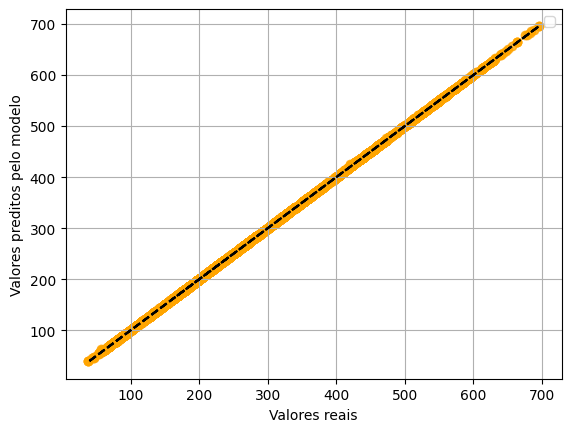

In [18]:
##################### HOMO ####################
print('Start of training', time.ctime())
inicio = time.ctime()


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from math import sqrt, ceil
from sklearn.model_selection import KFold, cross_val_score

import matplotlib.pyplot as plt
import csv
import time
import os
import joblib


import os


from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem.Descriptors import *
from rdkit.Chem.rdMolDescriptors import *
from rdkit.Chem.Lipinski import *

import numpy as np
import csv
from sklearn.model_selection import learning_curve

import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import pandas as pd

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

import numpy as np
import csv

rad = 2

n_est = 1000
sizeleaf = 5
m_fac = 733

X_temp, X_test, y_temp, y_test = train_test_split(pa_list, HOMO, test_size=0.3, random_state=200)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=200)  # 0.25 * 0.8 = 0.2

len_train = len(EE_list)
print(len_train)

m_node = ceil(len_train/sizeleaf)

regr = RandomForestRegressor(n_estimators=n_est, max_leaf_nodes=m_node, max_features=m_fac, n_jobs=-1)

modelo2 = Sequential()


modelo2.add(Dense(units=16, input_dim=len(pa_list[0]), activation='relu'))


modelo2.add(Dense(units=8, activation='relu'))


modelo2.add(Dense(units=1, activation='linear'))


modelo2.compile(optimizer='adam', loss='mean_absolute_error', metrics=['mean_squared_error'])

modelo2.summary()

history2 = modelo2.fit(X_train, y_train, epochs=20, batch_size=2, validation_data=(X_val, y_val))


print('Start of training', inicio)
print('End of training', time.ctime())

print(len(pa_list[0]))

import matplotlib.pyplot as plt


plt.plot(history2.history['loss'], label='Training Loss')
plt.plot(history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


plt.plot(history2.history['mean_squared_error'], label='Training MSE')
plt.plot(history2.history['val_mean_squared_error'], label='Validation MSE')
plt.xlabel('Epochs')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.show()


inicio = time.ctime()
y_pred = modelo2.predict(X_test)
resultados = avaliar_modelo(y_test, np.round(y_pred))
print(len(y_pred))



print("Resultados da avaliação do modelo de teste:")
for metrica, valor in resultados.items():
    print(f"{metrica}: {valor}")


y_pred2 = modelo2.predict(X_train)
resultados = avaliar_modelo(y_train, y_pred2)



print("Resultados da avaliação do modelo de treinamento:")
for metrica, valor in resultados.items():
    print(f"{metrica}: {valor}")

y_pred3 = modelo2.predict(X_val)
resultados = avaliar_modelo(y_val, y_pred3)



print("Resultados da avaliação do modelo de validação:")
for metrica, valor in resultados.items():
    print(f"{metrica}: {valor}")

print('Start of training', inicio)
print('End of training', time.ctime())


############ Gráfico Energy

# Plotar a reta y = x
plt.plot(y_test, y_test, linestyle='--', color='black', label='y = x')

# Plotar os pontos de teste e as previsões
plt.scatter(y_test, y_pred, alpha=0.5, color='orange', label='Pontos de Teste vs. Previsões')

# Configurar o gráfico
grafic(y_test, y_pred, 'orange')



In [21]:
#modelo2.save('HOMO-RNA.h5')
modelo2.save('HOMO-RNA.keras')
#funcImportances(modelo2, X_test)

Start of training Sun Sep  1 14:39:53 2024
150188


c:\Users\profr\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 16)             │        11,744 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,889 (46.44 KB)

 Trainable params: 11,889 (46.44 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 43s 1ms/step - loss: 0.4741 - mean_squared_error: 0.6936 - val_loss: 0.2157 - val_mean_squared_error: 0.0880
Epoch 2/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 44s 1ms/step - loss: 0.2119 - mean_squared_error: 0.0948 - val_loss: 0.1959 - val_mean_squared_error: 0.0777
Epoch 3/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 44s 1ms/step - loss: 0.1918 - mean_squared_error: 0.0840 - val_loss: 0.1995 - val_mean_squared_error: 0.0796
Epoch 4/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 42s 1ms/step - loss: 0.1815 - mean_squared_error: 0.1281 - val_loss: 0.1813 - val_mean_squared_error: 0.0683
Epoch 5/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 45s 1ms/step - loss: 0.1750 - mean_squared_error: 0.0850 - val_loss: 0.1741 - val_mean_squared_error: 0.0634
Epoch 6/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 53s 1ms/step - loss: 0.1719 - mean_squared_error: 0.1633 - val_loss: 0.1855 - val_mean_squared_error: 0.0692
Epoch 7/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 46s 1ms/step - loss: 0.1701 - mean_squ

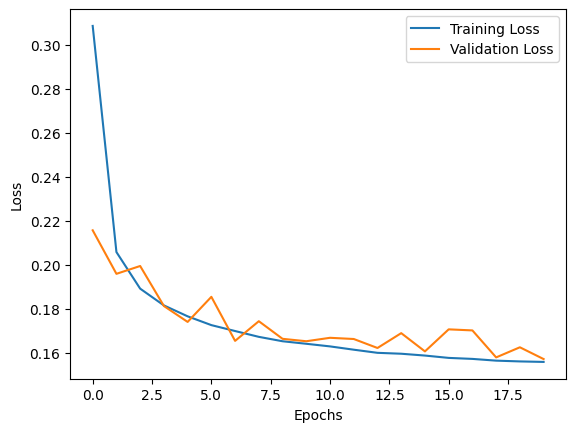

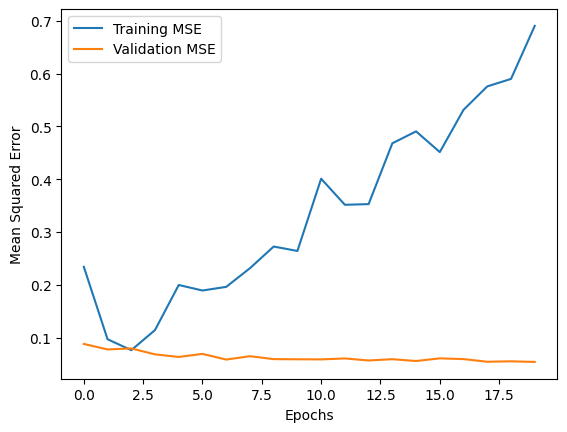

1409/1409 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
45057
Resultados da avaliação do modelo de teste:
MAE: 0.2918476729475997
MSE: 0.13401647640943692
RMSE: 0.36608260872299975
R2: 0.8669233702106534
2464/2464 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step
Resultados da avaliação do modelo de treinamento:
MAE: 0.14452839731457462
MSE: 0.5750866534262951
RMSE: 0.7583446798298878
R2: 0.42096242319592503
822/822 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Resultados da avaliação do modelo de validação:
MAE: 0.15720700567972123
MSE: 0.054009398942325954
RMSE: 0.23239922319647704
R2: 0.9452976777315151
Start of training Sun Sep  1 15:00:11 2024
End of training Sun Sep  1 15:00:23 2024


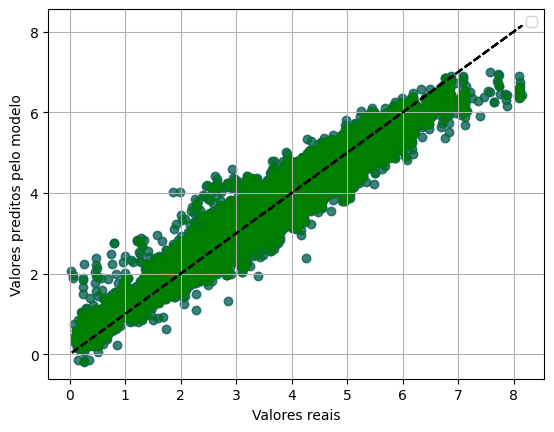

In [10]:
##################### Energy - RNA ####################
print('Start of training', time.ctime())
inicio = time.ctime()


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from math import sqrt, ceil
from sklearn.model_selection import KFold, cross_val_score

import matplotlib.pyplot as plt
import csv
import time
import os
import joblib


import os


from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem.Descriptors import *
from rdkit.Chem.rdMolDescriptors import *
from rdkit.Chem.Lipinski import *

import numpy as np
import csv
from sklearn.model_selection import learning_curve

import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import pandas as pd

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

import numpy as np
import csv

rad = 2

n_est = 1000
sizeleaf = 5
m_fac = 733

X_temp, X_test, y_temp, y_test = train_test_split(pa_list, EE_list, test_size=0.3, random_state=200)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=200)  # 0.25 * 0.8 = 0.2

len_train = len(EE_list)
print(len_train)

m_node = ceil(len_train/sizeleaf)

regr = RandomForestRegressor(n_estimators=n_est, max_leaf_nodes=m_node, max_features=m_fac, n_jobs=-1)

modelo2 = Sequential()


modelo2.add(Dense(units=16, input_dim=len(pa_list[0]), activation='relu'))


modelo2.add(Dense(units=8, activation='relu'))


modelo2.add(Dense(units=1, activation='linear'))


modelo2.compile(optimizer='adam', loss='mean_absolute_error', metrics=['mean_squared_error'])

modelo2.summary()

history2 = modelo2.fit(X_train, y_train, epochs=20, batch_size=2, validation_data=(X_val, y_val))


print('Start of training', inicio)
print('End of training', time.ctime())

print(len(pa_list[0]))

import matplotlib.pyplot as plt


plt.plot(history2.history['loss'], label='Training Loss')
plt.plot(history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


plt.plot(history2.history['mean_squared_error'], label='Training MSE')
plt.plot(history2.history['val_mean_squared_error'], label='Validation MSE')
plt.xlabel('Epochs')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.show()


inicio = time.ctime()
y_pred = modelo2.predict(X_test)
resultados = avaliar_modelo(y_test, np.round(y_pred))
print(len(y_pred))



print("Resultados da avaliação do modelo de teste:")
for metrica, valor in resultados.items():
    print(f"{metrica}: {valor}")


y_pred2 = modelo2.predict(X_train)
resultados = avaliar_modelo(y_train, y_pred2)



print("Resultados da avaliação do modelo de treinamento:")
for metrica, valor in resultados.items():
    print(f"{metrica}: {valor}")

y_pred3 = modelo2.predict(X_val)
resultados = avaliar_modelo(y_val, y_pred3)



print("Resultados da avaliação do modelo de validação:")
for metrica, valor in resultados.items():
    print(f"{metrica}: {valor}")

print('Start of training', inicio)
print('End of training', time.ctime())


############ Gráfico Energy

# Plotar a reta y = x
plt.plot(y_test, y_test, linestyle='--', color='black', label='y = x')

# Plotar os pontos de teste e as previsões
plt.scatter(y_test, y_pred, alpha=0.5, color='blue', label='Pontos de Teste vs. Previsões')

# Configurar o gráfico
grafic(y_test, y_pred, 'green')



Start of training Sun Sep  1 16:33:41 2024
150188


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6 (Dense)                 │ (None, 32)             │        23,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,161 (94.38 KB)

 Trainable params: 24,161 (94.38 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 48s 1ms/step - loss: 0.2392 - mean_squared_error: 0.2889 - val_loss: 0.1339 - val_mean_squared_error: 0.0454
Epoch 2/10
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 47s 1ms/step - loss: 0.1528 - mean_squared_error: 0.0750 - val_loss: 0.1445 - val_mean_squared_error: 0.0576
Epoch 3/10
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 47s 1ms/step - loss: 0.1492 - mean_squared_error: 0.0715 - val_loss: 0.1515 - val_mean_squared_error: 0.0656
Epoch 4/10
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 45s 1ms/step - loss: 0.1444 - mean_squared_error: 0.0692 - val_loss: 0.1246 - val_mean_squared_error: 0.0427
Epoch 5/10
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 47s 1ms/step - loss: 0.1441 - mean_squared_error: 0.0695 - val_loss: 0.1524 - val_mean_squared_error: 0.0697
Epoch 6/10
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 46s 1ms/step - loss: 0.1452 - mean_squared_error: 0.0734 - val_loss: 0.1370 - val_mean_squared_error: 0.0548
Epoch 7/10
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 46s 1ms/step - loss: 0.1437 - mean_squ

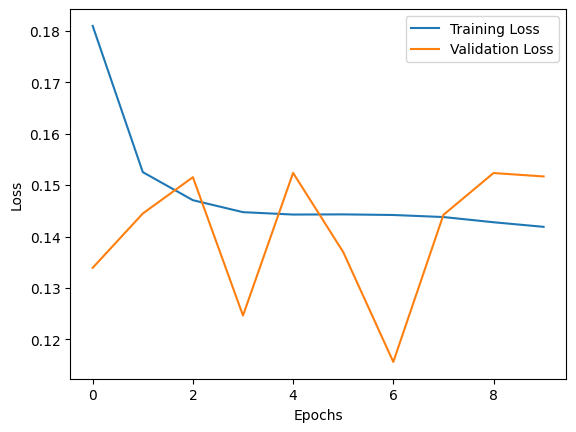

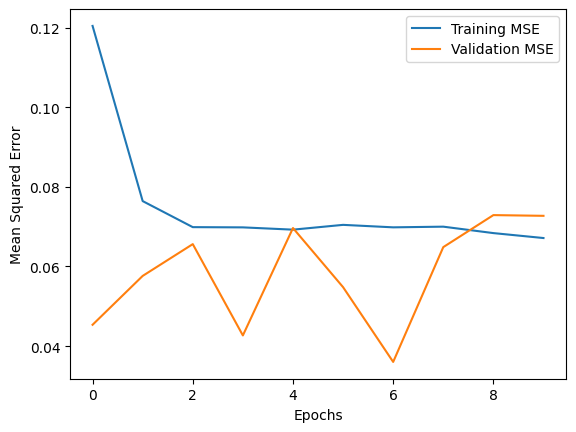

1409/1409 ━━━━━━━━━━━━━━━━━━━━ 1s 781us/step
45057
Resultados da avaliação do modelo de teste:
MAE: 0.22359241849213218
MSE: 0.13331912462525247
RMSE: 0.36512891507692524
R2: -0.06342935310603215
2464/2464 ━━━━━━━━━━━━━━━━━━━━ 2s 739us/step
Resultados da avaliação do modelo de treinamento:
MAE: 0.15061449095258445
MSE: 0.07194950280410428
RMSE: 0.2682340448267227
R2: 0.4311681364371459
822/822 ━━━━━━━━━━━━━━━━━━━━ 1s 913us/step
Resultados da avaliação do modelo de validação:
MAE: 0.15167880239110648
MSE: 0.07272343051749712
RMSE: 0.26967282124362685
R2: 0.4250104739125439
Start of training Sun Sep  1 16:41:28 2024
End of training Sun Sep  1 16:41:34 2024


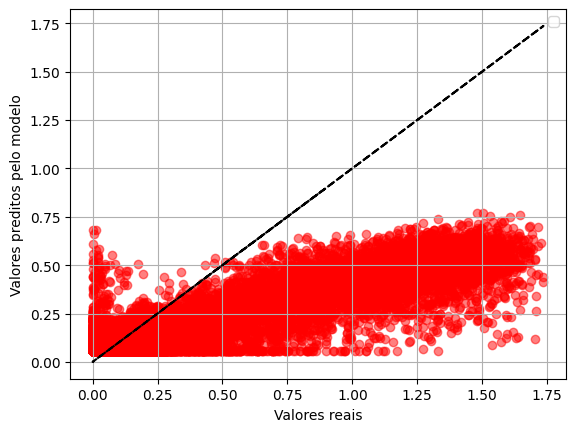

In [12]:
################# OS - ANN #######################

# Salvar o modelo completo para uso posterior
modelo2.save('model_energy_ANN.h5')
##################### OS - prediction ####################

from keras.layers import Dense, Dropout

print('Start of training', time.ctime())
inicio = time.ctime()

X_temp, X_test, y_temp, y_test = train_test_split(pa_list, OS_list, test_size=0.3, random_state=200)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=200)  # 0.25 * 0.8 = 0.2

len_train = len(EE_list)
print(len_train)

m_node = ceil(len_train/sizeleaf)

modelo2 = Sequential()


modelo2.add(Dense(units=32, input_dim=len(pa_list[0]), activation='relu'))
modelo2.add(Dropout(0.50))  # Adiciona Dropout com 50% de taxa de desativação

modelo2.add(Dense(units=16, activation='relu'))
modelo2.add(Dropout(0.50))  # Adiciona Dropout com 50% de taxa de desativação

modelo2.add(Dense(units=8, activation='relu'))
modelo2.add(Dropout(0.50))
modelo2.add(Dense(units=1, activation='linear'))


modelo2.compile(optimizer='adam', loss='mean_absolute_error', metrics=['mean_squared_error'])

modelo2.summary()

history2 = modelo2.fit(X_train, y_train, epochs=10, batch_size=2, validation_data=(X_val, y_val))


print('Start of training', inicio)
print('End of training', time.ctime())

print(len(pa_list[0]))

import matplotlib.pyplot as plt


plt.plot(history2.history['loss'], label='Training Loss')
plt.plot(history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


plt.plot(history2.history['mean_squared_error'], label='Training MSE')
plt.plot(history2.history['val_mean_squared_error'], label='Validation MSE')
plt.xlabel('Epochs')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.show()


inicio = time.ctime()
y_pred = modelo2.predict(X_test)
resultados = avaliar_modelo(y_test, np.round(y_pred))
print(len(y_pred))



print("Resultados da avaliação do modelo de teste:")
for metrica, valor in resultados.items():
    print(f"{metrica}: {valor}")


y_pred2 = modelo2.predict(X_train)
resultados = avaliar_modelo(y_train, y_pred2)



print("Resultados da avaliação do modelo de treinamento:")
for metrica, valor in resultados.items():
    print(f"{metrica}: {valor}")

y_pred3 = modelo2.predict(X_val)
resultados = avaliar_modelo(y_val, y_pred3)



print("Resultados da avaliação do modelo de validação:")
for metrica, valor in resultados.items():
    if metrica != 'mape':
        print(f"{metrica}: {valor}")

print('Start of training', inicio)
print('End of training', time.ctime())


############ Gráfico Energy

# Configurar o gráfico
grafic(y_test, y_pred, 'red')
modelo2.save('OS_ANN.h5')


Start of training Sun Sep  1 19:54:16 2024
150188


c:\Users\profr\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_19 (Dense)                │ (None, 16)             │        11,744 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,889 (46.44 KB)

 Trainable params: 11,889 (46.44 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 43s 1ms/step - loss: 30.4255 - mean_squared_error: 4299.0508 - val_loss: 6.1849 - val_mean_squared_error: 96.0071
Epoch 2/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 43s 1ms/step - loss: 5.9955 - mean_squared_error: 90.7063 - val_loss: 4.8078 - val_mean_squared_error: 58.4064
Epoch 3/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 44s 1ms/step - loss: 4.6917 - mean_squared_error: 63.5582 - val_loss: 4.6252 - val_mean_squared_error: 44.9349
Epoch 4/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 42s 1ms/step - loss: 4.0693 - mean_squared_error: 36.5964 - val_loss: 3.7864 - val_mean_squared_error: 33.1497
Epoch 5/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 42s 1ms/step - loss: 3.7233 - mean_squared_error: 31.1740 - val_loss: 3.3838 - val_mean_squared_error: 26.7613
Epoch 6/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 39s 1ms/step - loss: 3.4958 - mean_squared_error: 26.9099 - val_loss: 3.3678 - val_mean_squared_error: 25.8162
Epoch 7/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 42s 1ms/step - loss: 3.

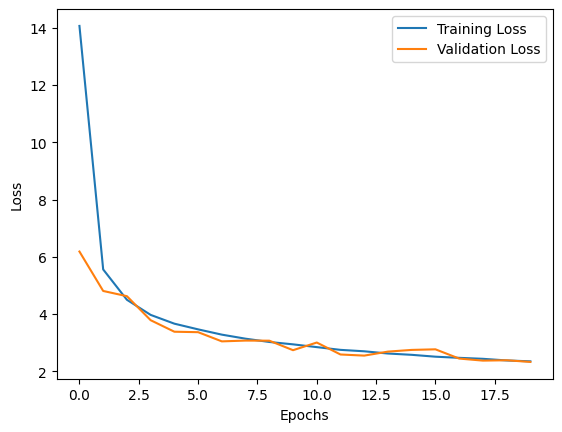

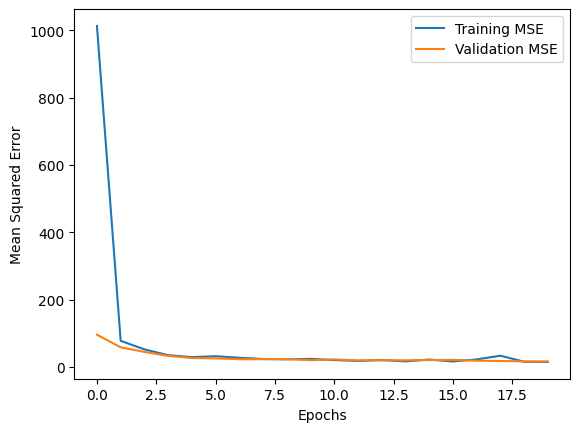

1409/1409 ━━━━━━━━━━━━━━━━━━━━ 1s 753us/step
45057
Resultados da avaliação do modelo de teste:
MAE: 2.3073884191135674
MSE: 11.282064939964933
RMSE: 3.358878524145363
R2: 0.9987976889595757
2464/2464 ━━━━━━━━━━━━━━━━━━━━ 2s 677us/step
Resultados da avaliação do modelo de treinamento:
MAE: 2.2664493709415585
MSE: 35.337396002435064
RMSE: 5.944526558308497
R2: 0.9962326783192915
822/822 ━━━━━━━━━━━━━━━━━━━━ 1s 681us/step
Resultados da avaliação do modelo de validação:
MAE: 2.3185709393904808
MSE: 16.713807404025417
RMSE: 4.088252365501109
R2: 0.9981749813092785
Start of training Sun Sep  1 20:08:36 2024
End of training Sun Sep  1 20:08:41 2024


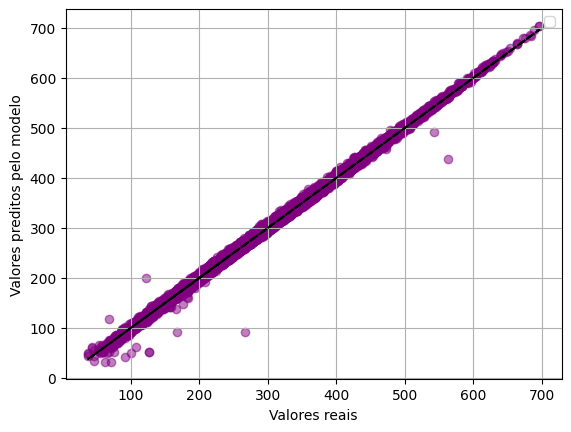

In [16]:
##################### MO_i - RNA ####################
print('Start of training', time.ctime())
inicio = time.ctime()

X_temp, X_test, y_temp, y_test = train_test_split(pa_list, FO_list, test_size=0.3, random_state=200)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=200)  

len_train = len(EE_list)
print(len_train)

m_node = ceil(len_train/sizeleaf)

regr = RandomForestRegressor(n_estimators=n_est, max_leaf_nodes=m_node, max_features=m_fac, n_jobs=-1)

modelo2 = Sequential()


modelo2.add(Dense(units=16, input_dim=len(pa_list[0]), activation='relu'))


modelo2.add(Dense(units=8, activation='relu'))


modelo2.add(Dense(units=1, activation='linear'))


modelo2.compile(optimizer='adam', loss='mean_absolute_error', metrics=['mean_squared_error'])

modelo2.summary()

history2 = modelo2.fit(X_train, y_train, epochs=20, batch_size=2, validation_data=(X_val, y_val))


print('Start of training', inicio)
print('End of training', time.ctime())

print(len(pa_list[0]))

import matplotlib.pyplot as plt


plt.plot(history2.history['loss'], label='Training Loss')
plt.plot(history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


plt.plot(history2.history['mean_squared_error'], label='Training MSE')
plt.plot(history2.history['val_mean_squared_error'], label='Validation MSE')
plt.xlabel('Epochs')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.show()


inicio = time.ctime()
y_pred = modelo2.predict(X_test)
resultados = avaliar_modelo(y_test, np.round(y_pred))
print(len(y_pred))



print("Resultados da avaliação do modelo de teste:")
for metrica, valor in resultados.items():
    print(f"{metrica}: {valor}")


y_pred2 = modelo2.predict(X_train)
resultados = avaliar_modelo(y_train, np.round(y_pred2))



print("Resultados da avaliação do modelo de treinamento:")
for metrica, valor in resultados.items():
    print(f"{metrica}: {valor}")

y_pred3 = modelo2.predict(X_val)
resultados = avaliar_modelo(y_val, np.round(y_pred3))



print("Resultados da avaliação do modelo de validação:")
for metrica, valor in resultados.items():
    print(f"{metrica}: {valor}")

print('Start of training', inicio)
print('End of training', time.ctime())


############ Gráfico FO

grafic(y_test, y_pred, 'purple')

modelo2.save('HO_ANN.h5')

Start of training Sun Sep  1 19:35:23 2024
150188


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_16 (Dense)                │ (None, 16)             │        11,744 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,889 (46.44 KB)

 Trainable params: 11,889 (46.44 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 46s 1ms/step - loss: 31.0995 - mean_squared_error: 4434.7944 - val_loss: 6.5831 - val_mean_squared_error: 101.2781
Epoch 2/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 41s 1ms/step - loss: 6.2622 - mean_squared_error: 99.6083 - val_loss: 4.8562 - val_mean_squared_error: 63.6500
Epoch 3/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 38s 972us/step - loss: 4.9384 - mean_squared_error: 65.4114 - val_loss: 5.3047 - val_mean_squared_error: 63.7764
Epoch 4/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 40s 1ms/step - loss: 4.3223 - mean_squared_error: 65.0297 - val_loss: 3.8403 - val_mean_squared_error: 45.2960
Epoch 5/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 40s 1ms/step - loss: 3.8749 - mean_squared_error: 42.5855 - val_loss: 3.8929 - val_mean_squared_error: 42.9468
Epoch 6/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 39s 984us/step - loss: 3.5299 - mean_squared_error: 34.3668 - val_loss: 3.4640 - val_mean_squared_error: 36.9568
Epoch 7/20
39424/39424 ━━━━━━━━━━━━━━━━━━━━ 44s 1ms/step - los

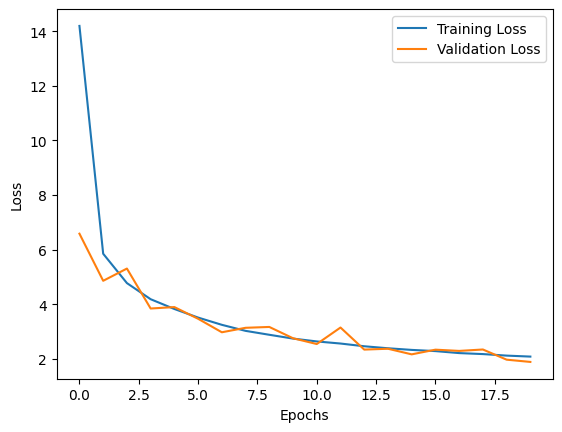

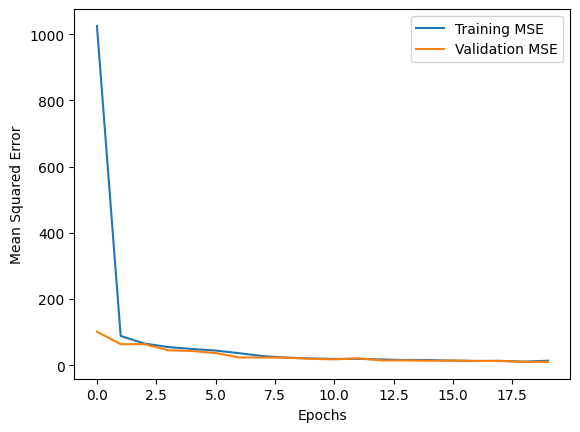

1409/1409 ━━━━━━━━━━━━━━━━━━━━ 1s 755us/step
45057
Resultados da avaliação do modelo de teste:
MAE: 1.85294182923852
MSE: 9.415806644916438
RMSE: 3.0685186401448563
R2: 0.9990093815603918
2464/2464 ━━━━━━━━━━━━━━━━━━━━ 2s 649us/step
Resultados da avaliação do modelo de treinamento:
MAE: 1.843768421681477
MSE: 14.73299268949223
RMSE: 3.838358072078767
R2: 0.9984496874453069
822/822 ━━━━━━━━━━━━━━━━━━━━ 1s 645us/step
Resultados da avaliação do modelo de validação:
MAE: 1.8825688834731558
MSE: 10.097824657573168
RMSE: 3.1777074531135128
R2: 0.9989121433322883
Start of training Sun Sep  1 19:49:02 2024
End of training Sun Sep  1 19:49:08 2024


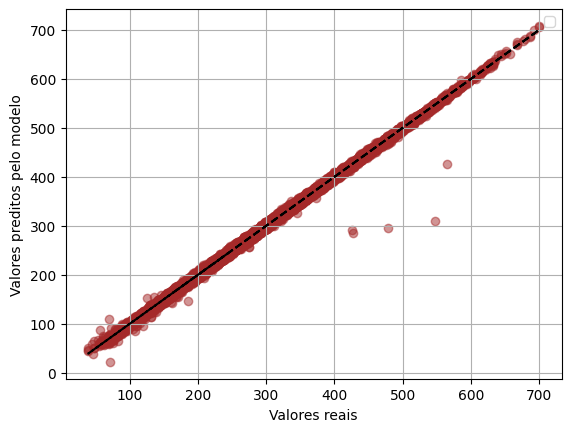

In [15]:
##################### MO_f - RNA ####################
print('Start of training', time.ctime())
inicio = time.ctime()

X_temp, X_test, y_temp, y_test = train_test_split(pa_list, SO_list, test_size=0.3, random_state=200)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=200)  

len_train = len(EE_list)
print(len_train)

m_node = ceil(len_train/sizeleaf)

regr = RandomForestRegressor(n_estimators=n_est, max_leaf_nodes=m_node, max_features=m_fac, n_jobs=-1)

modelo2 = Sequential()


modelo2.add(Dense(units=16, input_dim=len(pa_list[0]), activation='relu'))


modelo2.add(Dense(units=8, activation='relu'))


modelo2.add(Dense(units=1, activation='linear'))


modelo2.compile(optimizer='adam', loss='mean_absolute_error', metrics=['mean_squared_error'])

modelo2.summary()

history2 = modelo2.fit(X_train, y_train, epochs=20, batch_size=2, validation_data=(X_val, y_val))


print('Start of training', inicio)
print('End of training', time.ctime())

print(len(pa_list[0]))

import matplotlib.pyplot as plt


plt.plot(history2.history['loss'], label='Training Loss')
plt.plot(history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


plt.plot(history2.history['mean_squared_error'], label='Training MSE')
plt.plot(history2.history['val_mean_squared_error'], label='Validation MSE')
plt.xlabel('Epochs')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.show()


inicio = time.ctime()
y_pred = modelo2.predict(X_test)
resultados = avaliar_modelo(y_test, np.round(y_pred))
print(len(y_pred))



print("Resultados da avaliação do modelo de teste:")
for metrica, valor in resultados.items():
    print(f"{metrica}: {valor}")


y_pred2 = modelo2.predict(X_train)
resultados = avaliar_modelo(y_train, y_pred2)



print("Resultados da avaliação do modelo de treinamento:")
for metrica, valor in resultados.items():
    print(f"{metrica}: {valor}")

y_pred3 = modelo2.predict(X_val)
resultados = avaliar_modelo(y_val, y_pred3)



print("Resultados da avaliação do modelo de validação:")
for metrica, valor in resultados.items():
    print(f"{metrica}: {valor}")

print('Start of training', inicio)
print('End of training', time.ctime())


############ Gráfico FO

grafic(y_test, y_pred, 'brown')
modelo2.save('LU_ANN.h5')
